# Preprocessing

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import math
import seaborn as sns



train_df = pd.read_csv('survey.csv')     #input data

# DATA PREPROCESSING: GENDER  
#Let's make other category based on entries existing less than 3 times
train_data = train_df.values
dictionary_entries_gender = dict()
other_str = []
#Iterate to count number of times each entry exists
for entry in train_data[:,2]:
    if entry in dictionary_entries_gender:
        dictionary_entries_gender[entry] += 1
    else:
        dictionary_entries_gender[entry] = 1

#Let's see frequency of each entry and then decide is we need ot make an "Other" category
#print(dictionary_entries_gender)

#Final Gender entries based on results above
male_str = ['Male', 'Mal', 'Male (CIS)', 'Mail', 'Malr', 'Cis Man', 'M', 'male', 'm', 'maile', 'Cis Male', 'Make', 'Male ', "Man", 'msle', 'cis male']
female_str = ['Female', 'Cis Female', 'Femake', 'female', 'F', 'Woman', 'f', 'woman', 'Female ', 'cis-female/femme', 'Female (cis)', 'femail']
trans_str = ['Trans-female', 'Guy (-ish) ^_^', 'Trans woman', 'Male-ish', "something kinda male?", 'queer/she/they', "Female (trans)"]
other_str = ['All', 'Enby', 'Genderqueer', 'Androgyne', 'Agender', 'Neuter', 'Female (cis)', 'non-binary', 'Nah', 'fluid', 'male leaning androgynous', "queer", 'A little about you', 'p', 'ostensibly male, unsure what that really means']
#Let's process our data in the dataset 
for (row, col) in train_df.iterrows():

    if str(col.Gender) in male_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Male', inplace=True)

    if str(col.Gender) in female_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Female', inplace=True)

    if str(col.Gender) in trans_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Trans', inplace=True)

    if str(col.Gender) in other_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Other', inplace=True)
        
        
        
        
        
        
        
        
        
        
#DATA PREPROCESSING: AGE - run only once or you will get an error message
#Get the average age
train_data_ages = train_df.values
ages = train_data_ages[:,1]
count = 0 
index_to_remove = []
values_to_replace = []
for age in ages:
    if (age > 120) or (age < 16):
        index_to_remove.append(count)
        values_to_replace.append(age)
    count += 1
ages_cleaned = np.delete(ages, index_to_remove)
average_age = round(np.mean(ages_cleaned))


#DATA PREPROCESSING FOR ENCODING : need to change nan values or encoding wont work, found out the hard way :( 
for feature in train_df:
    if(train_df[feature].isnull().values.any()):
        train_df[feature] = train_df[feature].replace(np.nan, "NA")
        

##### Varaibles Needed Later But Before Encoding

In [58]:
states_text = train_df['state']
country_text = train_df['Country']
countries = np.unique(country_text.values)
countries = sorted(countries)

# Encoding

In [60]:

#DATA PREPROCESSING FOR ENCODING : need to change nan values or encoding wont work, found out the hard way :( 
for feature in train_df:
    if(train_df[feature].isnull().values.any()):
        train_df[feature] = train_df[feature].replace(np.nan, "NA")


#Encoding 
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
for feature in train_df:
    if (feature != "Age" and feature != "Timestamp"):
        le = LabelEncoder()
        le.fit(train_df[feature].unique())
        train_df[feature] = le.transform(train_df[feature])
    else:
        pass

#TIMESTAMP REMOVED    
train_df = train_df.loc[:, train_df.columns != 'Timestamp']
# train_df = train_df.loc[:, train_df.columns != 'comments']
# train_df = train_df.loc[:, train_df.columns != 'Country'] #remove
# train_df = train_df.loc[:, train_df.columns != 'state'] #remove
# train_df = train_df.loc[:, train_df.columns != 'Age'] #remove
#train_df= train_df.drop('comments', axis = 1)
train_df.head()

,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
0,37,0,45,10,0,0,1,2,4,0,...,2,2,1,1,1,2,1,0,2,0
1,44,1,45,11,0,0,0,3,5,0,...,0,0,0,1,0,0,1,1,0,0
2,32,1,7,22,0,0,0,3,4,0,...,0,1,1,1,2,2,2,2,1,0
3,31,1,44,22,0,1,1,2,2,0,...,1,1,2,2,1,0,0,0,1,1
4,31,1,45,38,0,0,0,1,1,1,...,0,0,1,1,1,2,2,2,0,0


### Data for later, needed to be encoded first

In [50]:
states_encoded = train_df['state'].values
countries_encoded = train_df['Country'].values

# K Modes

### Example K Modes, used to make sure you have all imported packages

In [7]:
from kmodes import kmodes
print(kmodes)
# random categorical data
data = np.random.choice(20, (100, 10))
print(data)
km = kmodes.KModes(n_clusters=4, init='Huang', n_init=5, verbose=1)

clusters = km.fit_predict(data)

# Print the cluster centroids
print(km.cluster_centroids_)
print(km.labels_)
x = km.labels_

<module 'kmodes.kmodes' from '/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/kmodes/kmodes.py'>
[[11  5 10 11 15 10  7  3 18  6]
 [11  6 16  0 19  5  3  8  5  1]
 [17 11 19  6 10  2  9  8  8  3]
 [12  9  4 10 15  7  6 12 12  5]
 [ 1  6  2 15 13  8  7  2 10 12]
 [17  7  1  1  9 18 10  3  8  3]
 [ 4  5 17 13 14 17  2  8 14 15]
 [15 19  9 13  1 10 12 15  9  2]
 [14 17  8 13 10 14  9  4 11 17]
 [ 7 10 10 11 12  5 10  2  2  7]
 [ 0 14  8 18 13  6  0 12 19 15]
 [10  2  3  3 10  1 10  4  4  8]
 [11 12  5 13 19  7  4  4  9  3]
 [ 0 10  6 14  7  8 19 12  9 10]
 [ 4 16 10  7  6 18  0 11  7 18]
 [ 8 11  5 12 12  4 10 11  1 12]
 [12  8  8  2  6  7  7  9  4  1]
 [16  6  7  9 19 11 17  6 19  6]
 [ 1  2 18  4 16  9  7  8 14 12]
 [19  2  3  6 12 10  6  3  5  3]
 [ 9  6  5 19 17 10  5  5  6 16]
 [ 1  3 10 14 17 18 19  1 14  0]
 [19  1  5 10  4  2  7 12 16 14]
 [11 11 16  0 10 18 11 15  4  5]
 [15  6  3  0  1  7  0  8 17  6]
 [11 15 17 14  2 17 10 18  0  7]
 [ 6  1  3  5  2  2 12 12  3 12]
 [

### Cost Curve, same as silhouette, with the cost function given by kmodes. This is the shorter one, we only run 10 iterations, plotting between 1 and 10 clusters.


<module 'kmodes.kmodes' from '/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/kmodes/kmodes.py'>
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 331, cost: 9305.0
Run 1, iteration: 2/100, moves: 66, cost: 9305.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 570, cost: 9512.0
Run 2, iteration: 2/100, moves: 208, cost: 9408.0
Run 2, iteration: 3/100, moves: 58, cost: 9408.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 508, cost: 9367.0
Run 3, iteration: 2/100, moves: 268, cost: 9244.0
Run 3, iteration: 3/100, moves: 70, cost: 9244.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 461, cost: 9397.0
Run 4, iteration: 2/100, moves: 40, cost: 9381.0
Run 4, iteration: 3/100, moves: 1, cost: 9381.0
Init: initializing centroids


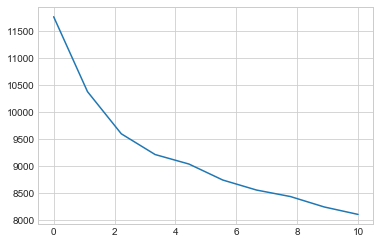

In [9]:
import numpy as np
#from kmodes.kmodes import kmodes
from kmodes import kmodes
print(kmodes)
# random categorical data
data = train_df

km = kmodes.KModes(n_clusters=4, init='Huang', n_init=5, verbose=1)

clusters = km.fit_predict(data)
clusters_cost = []
for i in range(1,11):
    km = kmodes.KModes(n_clusters= i, init='Huang', n_init=5, verbose=1)
    clusters = km.fit_predict(data)
    clusters_cost.append(km.cost_)

plt.style.use('seaborn-whitegrid')
import numpy as np
fig = plt.figure()
ax = plt.axes()
x = np.linspace(0, 10, 10)
ax.plot(x, clusters_cost);

### Cost Curve, same as silhouette, with the cost function given by kmodes. This is the longer one, we run 25 iterations, plotting between 1 and 25 clusters. 

In [ ]:
# import matplotlib.pyplot as plt
import numpy as np
#from kmodes.kmodes import kmodes
from kmodes import kmodes
print(kmodes)
# random categorical data
data = train_df
km = kmodes.KModes(n_clusters=4, init='Huang', n_init=5, verbose=1)
clusters = km.fit_predict(data)
clusters_cost = []
for i in range(1,26):
    km = kmodes.KModes(n_clusters= i, init='Huang', n_init=5, verbose=1)
    clusters = km.fit_predict(data)
    clusters_cost.append(km.cost_)


plt.style.use('seaborn-whitegrid')
import numpy as np
fig = plt.figure()
ax = plt.axes()
x = np.linspace(0, 25, 25)
ax.plot(x, clusters_cost);

# Random Forest

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from IPython.display import display
from sklearn import metrics

# Labels are the values we want to predict
labels = np.array(train_df['treatment'])
# Remove the labels from the features
# axis 1 refers to the columns
train_df= train_df.drop('treatment', axis = 1)
# Saving feature names for later use
train_df_list = list(train_df.columns)
# Convert to numpy array
#train_df = np.array(train_df)
#Split the data
X_train, X_test, y_train, y_test = train_test_split(train_df, labels, test_size = 0.25, random_state = 42)

KeyError: 'treatment'

### Simple Random Forest

##### Accuracy

In [12]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestRegressor
X_train, X_test, y_train, y_test = train_test_split(train_df, labels, test_size = 0.25, random_state = 42)
#cross validation
#The random forest
m = RandomForestClassifier(n_estimators=20)
m.fit(X_train, y_train)
#The train and test data
pred_test = m.predict(X_test)
pred_train = m.predict(X_train)
print("Training Accuracy: ", m.score(X_train,y_train))

Training Accuracy:  0.9989406779661016


##### F1 Score: For both training and testing data

In [14]:
from sklearn import metrics
# testing score
score = metrics.f1_score(y_test, pred_test)
print("Testing data")
print(score)
# training score
score_train = metrics.f1_score(y_train, pred_train)
print("Training data")
print(score_train)

Testing data
0.8277945619335347
Training data
0.9989572471324296


### With oob

In [15]:
#The random forest
m = RandomForestClassifier(n_estimators=20, oob_score = True)
m.fit(X_train, y_train)
#The train and test data
pred_test = m.predict(X_test)
pred_train = m.predict(X_train)
score_train = metrics.f1_score(y_train, pred_train)
score = metrics.f1_score(y_test, pred_test)
print("Training Accuracy: ", m.score(X_train,y_train))
print("OOB Classification Accuracy: ", m.oob_score_)
print("F1 Score: Training data")
print(score_train)
print("F1 Score: Testing data")
print(score)

Training Accuracy:  1.0
OOB Classification Accuracy:  0.7870762711864406
F1 Score: Training data
1.0
F1 Score: Testing data
0.8132530120481928


### Number of trees, no oob

[0.8951271186440678, 0.9608050847457628, 0.9777542372881356, 0.9819915254237288, 0.9925847457627118, 0.989406779661017, 0.996822033898305, 0.9978813559322034, 0.996822033898305, 0.9978813559322034]


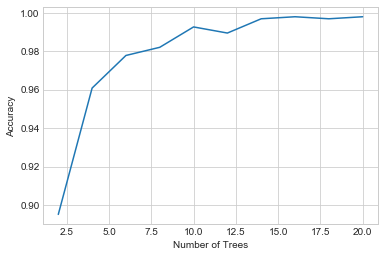

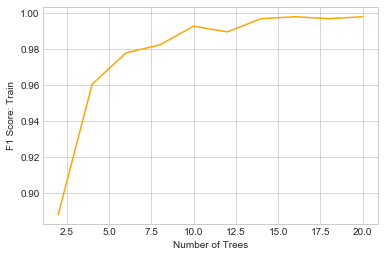

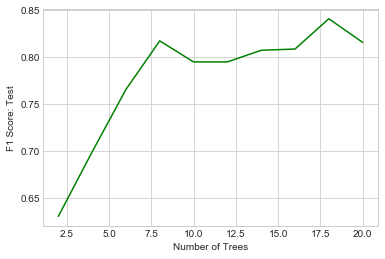

In [18]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

accuracy = []
F1_train = []
F1_test = []
for trees in range(2, 22, 2):
    m = RandomForestClassifier(n_estimators=trees)
    m.fit(X_train, y_train)
    accuracy.append(m.score(X_train,y_train))
    pred_test = m.predict(X_test)
    pred_train = m.predict(X_train)
    F1_test.append(metrics.f1_score(y_test, pred_test))
    F1_train.append(metrics.f1_score(y_train, pred_train))

    

print(accuracy)
plt.plot(range(2,22,2), accuracy)
plt.xlabel("Number of Trees")
plt.ylabel("Accuracy")
plt.show()
plt.plot(range(2,22,2), F1_train, 'orange')
plt.xlabel("Number of Trees")
plt.ylabel("F1 Score: Train")
plt.show()
plt.plot(range(2,22,2), F1_test, 'g')
plt.xlabel("Number of Trees")
plt.ylabel("F1 Score: Test")
plt.show()

### Number of trees, oob

/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/Users/carlosarroyo/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/fores

[0.9036016949152542, 0.9586864406779662, 0.975635593220339, 0.9841101694915254, 0.9915254237288136, 0.9936440677966102, 0.9957627118644068, 0.996822033898305, 0.9936440677966102, 0.9957627118644068]


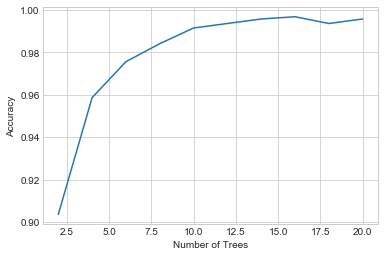

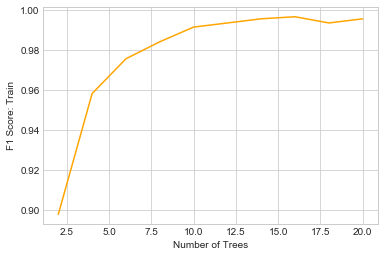

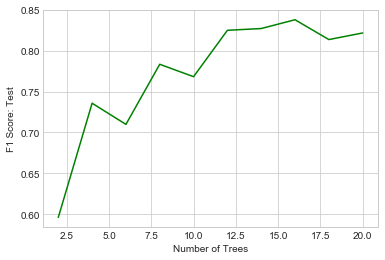

In [19]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

accuracy = []
F1_train = []
F1_test = []
for trees in range(2, 22, 2):
    m = RandomForestClassifier(n_estimators=trees, oob_score = True)
    m.fit(X_train, y_train)
    accuracy.append(m.score(X_train,y_train))
    pred_test = m.predict(X_test)
    pred_train = m.predict(X_train)
    F1_test.append(metrics.f1_score(y_test, pred_test))
    F1_train.append(metrics.f1_score(y_train, pred_train))

    

print(accuracy)
plt.plot(range(2,22,2), accuracy)
plt.xlabel("Number of Trees")
plt.ylabel("Accuracy")
plt.show()
plt.plot(range(2,22,2), F1_train, 'orange')
plt.xlabel("Number of Trees")
plt.ylabel("F1 Score: Train")
plt.show()
plt.plot(range(2,22,2), F1_test, 'g')
plt.xlabel("Number of Trees")
plt.ylabel("F1 Score: Test")
plt.show()

### Due to results, will move forward with no oob and using 15 trees

### Tree to use moving forward

In [22]:
m = RandomForestClassifier(n_estimators=15)
m.fit(X_train, y_train)
#The train and test data
pred_test = m.predict(X_test)
pred_train = m.predict(X_train)
print("Training Accuracy: ", m.score(X_train,y_train))
#F1 Score
# training score
score_train = metrics.f1_score(y_train, pred_train)
print("F1 Score: Training data")
print(score_train)
#Testing score
score = metrics.f1_score(y_test, pred_test)
print("F1 Score: Testing data")
print(score)

Training Accuracy:  0.9947033898305084
F1 Score: Training data
0.9947970863683663
F1 Score: Testing data
0.8263473053892217


### Feature Importance

Index(['Gender', 'self_employed', 'family_history', 'work_interfere',
       'no_employees', 'remote_work', 'tech_company', 'benefits',
       'care_options', 'wellness_program', 'seek_help', 'anonymity', 'leave',
       'mental_health_consequence', 'phys_health_consequence', 'coworkers',
       'supervisor', 'mental_health_interview', 'phys_health_interview',
       'mental_vs_physical', 'obs_consequence'],
      dtype='object')
[0.02841564 0.01405361 0.08358636 0.34903154 0.04850996 0.01883204
 0.01637444 0.04040031 0.04926405 0.0257628  0.02973398 0.02820537
 0.04510627 0.02942454 0.02118006 0.03128626 0.03613845 0.0163876
 0.03480999 0.03193069 0.02156605]
work_inference, family_history, Age, Country, state, care_options, no_employees


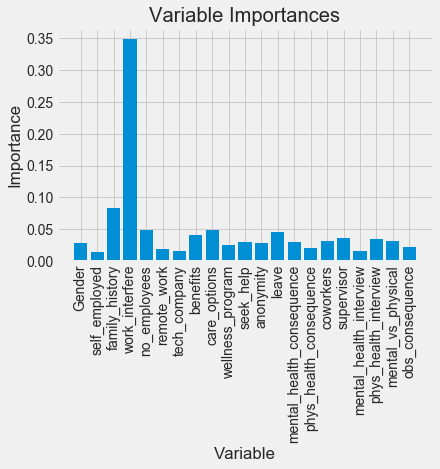

In [23]:
import pandas as pd
feature_importances = pd.DataFrame(m.feature_importances_, index = X_train.columns, columns=['importance']).sort_values('importance',ascending=False)
feature_importances

# Import matplotlib for plotting and use magic command for Jupyter Notebooks
import matplotlib.pyplot as plt
# Set the style
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(m.feature_importances_)))
# Make a bar chart
plt.bar(X_train.columns, m.feature_importances_, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, X_train.columns, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');
print(X_train.columns)
print(m.feature_importances_)
print("work_inference, family_history, Age, Country, state, care_options, no_employees")
relevant_features = ["work_inference", "family_history" , "Age", "Country", "state", "care_options", "no_employees"]


### Visualization of tree 

In [25]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
# Pull out one tree from the forest
tree = m.estimators_[5]
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = train_df_list, rounded = True, precision = 1)
# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

# t-SNE

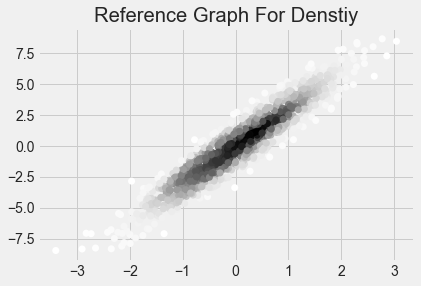

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Generate fake data
x = np.random.normal(size=1000)
y = x * 3 + np.random.normal(size=1000)

# Calculate the point density
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots()
ax.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("Reference Graph For Denstiy")
plt.show()

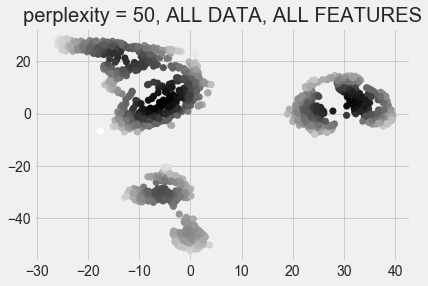

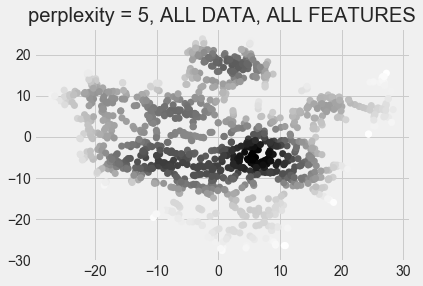

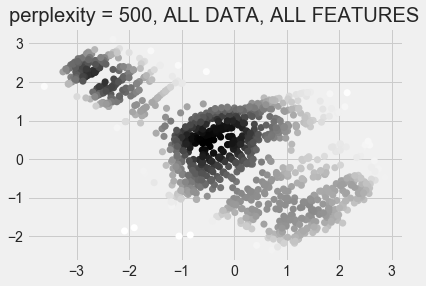

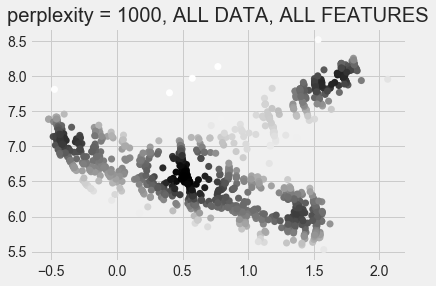

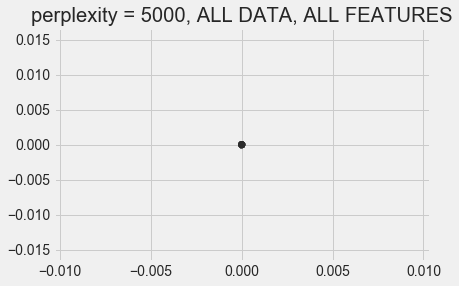

In [61]:
from sklearn.manifold import TSNE
from scipy.stats import gaussian_kde
x_input = train_df.values # ALL DATA ALL FEATURES
X_embedded = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 50, ALL DATA, ALL FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 5).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 5, ALL DATA, ALL FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 500).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 500, ALL DATA, ALL FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 1000).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 1000, ALL DATA, ALL FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 5000).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 5000, ALL DATA, ALL FEATURES")
plt.show()
#BASED ON RANDOM FOREST TOP 6 FEATURES

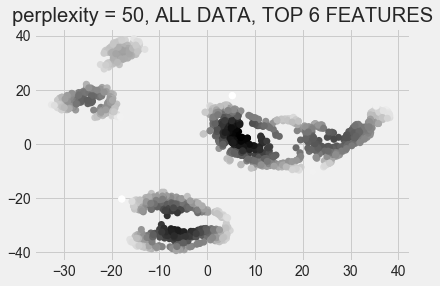

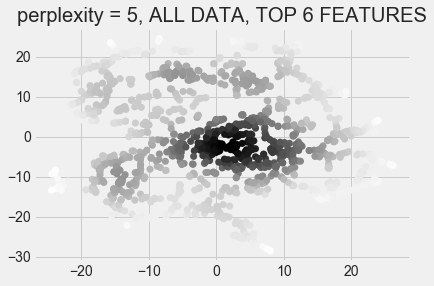

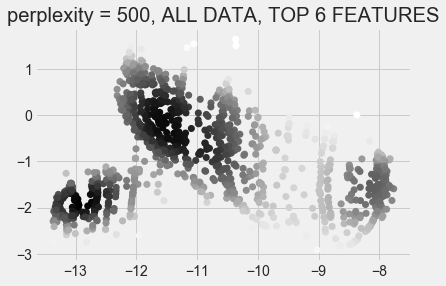

KeyboardInterrupt: 

In [62]:
from sklearn.manifold import TSNE
from scipy.stats import gaussian_kde
relevant_features = ["work_interfere", "family_history" , "Age", "Country", "state", "care_options", "no_employees"]
x_input = train_df[relevant_features].values # ALL DATA, TOP 6 FEATURES
X_embedded = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 50, ALL DATA, TOP 6 FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 5).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 5, ALL DATA, TOP 6 FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 500).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 500, ALL DATA, TOP 6 FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 1000).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 1000, ALL DATA, TOP 6 FEATURES")
plt.show()

X_embedded = TSNE(n_components=3, perplexity = 5000).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
plt.scatter(x, y, c=z, s=50, edgecolor='')
plt.title("perplexity = 5000, ALL DATA, TOP 6 FEATURES")
plt.show()
#BASED ON RANDOM FOREST TOP 6 FEATURES

### Labeling 

### Family History

[0 1]


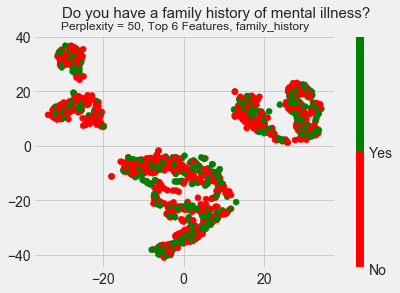

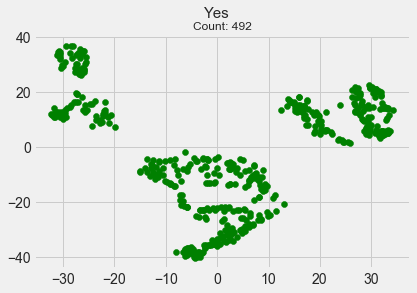

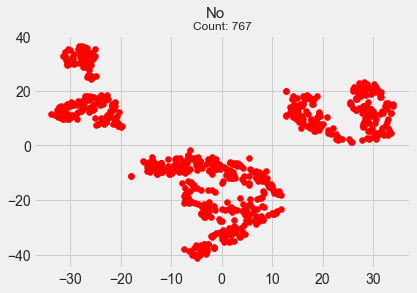

In [64]:
from sklearn.manifold import TSNE
from scipy.stats import gaussian_kde
import matplotlib
relevant_features = ["work_interfere", "family_history" , "Age", "Country", "state", "care_options", "no_employees"]
x_input = train_df[relevant_features].values # ALL DATA, TOP 6 FEATURES
X_embedded = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,1]
print(np.unique(label))
colors = ['red','green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.suptitle("Do you have a family history of mental illness?", fontsize = 15)
plt.title("Perplexity = 50, Top 6 Features, family_history", fontsize=12)
colors = ['No','Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()



#GREEN
yes_X = []
count = 0
for entry in label:
    if(entry):
        yes_X.append(X_embedded[count])
    count += 1

#print(yes_X)
yes_X = np.array(yes_X)
x = yes_X[:,0]
y = yes_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 492", fontsize=12)
plt.show()


#RED
no_X = []
count = 0
for entry in label:
    if(entry == 0):
        no_X.append(X_embedded[count])
    count += 1
    
no_X = np.array(no_X)
x = no_X[:,0]
y = no_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 767", fontsize=12)
plt.show()

### Health Care

[0 1 2]
[1 0 0 ... 2 2 2]


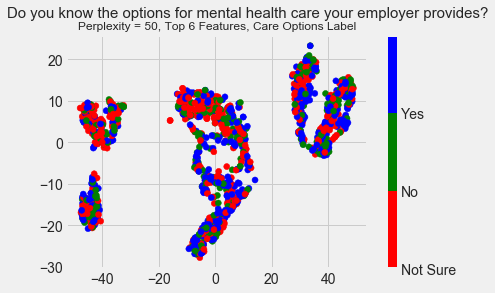

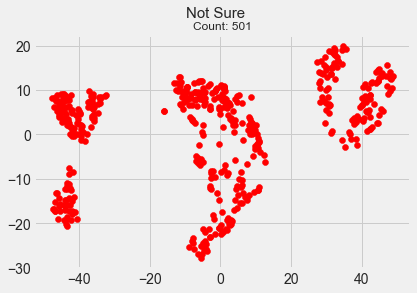

501


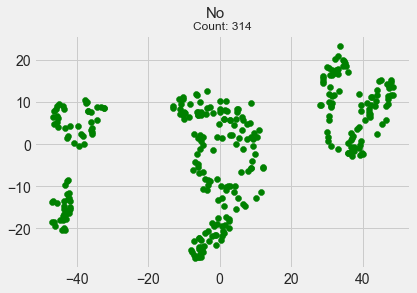

314


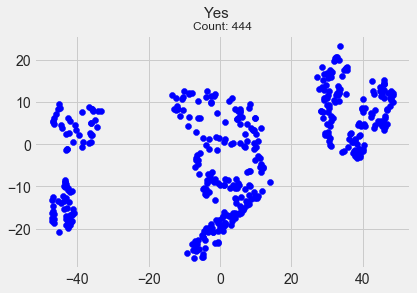

444


In [34]:
from sklearn.manifold import TSNE
from scipy.stats import gaussian_kde
import matplotlib
relevant_features = ["work_interfere", "family_history" , "Age", "Country", "state", "care_options", "no_employees"]
x_input = train_df[relevant_features].values # ALL DATA, TOP 6 FEATURES
X_embedded = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,5]
print(np.unique(label))
colors = ['red','green', 'blue']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("Perplexity = 50, Top 6 Features, Care Options Label", fontsize=12)
print(label)
colors = ['Not Sure','No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)

plt.show()





#NOT SURE
Not_Sure_X = []
count = 0
for entry in label:
    if(entry == 0):
        Not_Sure_X.append(X_embedded[count])
    count += 1

#print(yes_X)
Not_Sure_X = np.array(Not_Sure_X)
x = Not_Sure_X[:,0]
y = Not_Sure_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Not Sure", fontsize = 15)
plt.title("Count: 501", fontsize=12)
plt.show()
print(len(Not_Sure_X))

#NO
no_X = []
count = 0
for entry in label:
    if(entry == 1):
        no_X.append(X_embedded[count])
    count += 1
    
no_X = np.array(no_X)
x = no_X[:,0]
y = no_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 314", fontsize=12)
plt.show()
print(len(no_X))

#YES
Yes_X = []
count = 0
for entry in label:
    if(entry == 2):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 444", fontsize=12)
plt.show()
print(len(Yes_X))

### work interfere

[0 1 2 3 4]


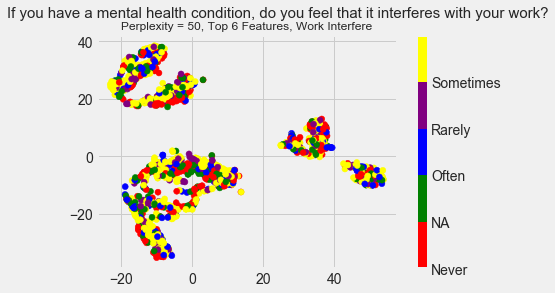

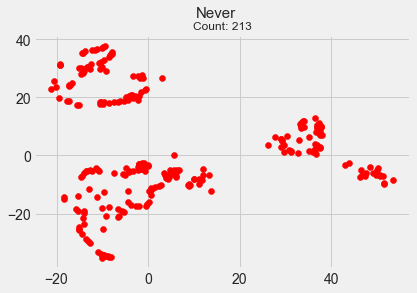

264


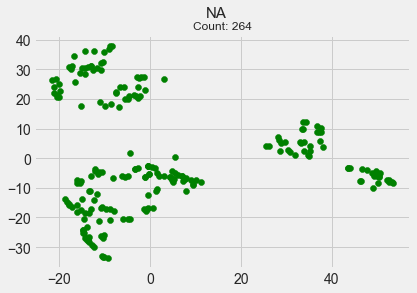

213


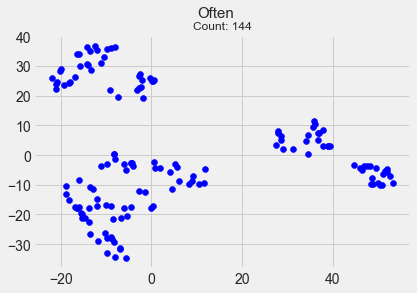

144


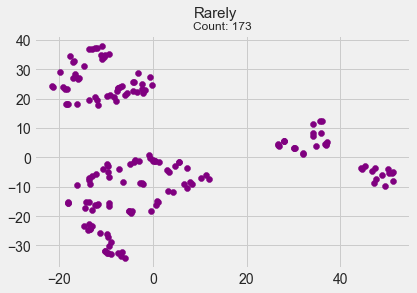

173


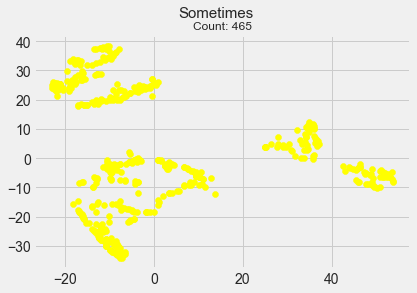

465


In [35]:
from sklearn.manifold import TSNE
from scipy.stats import gaussian_kde
import matplotlib
relevant_features = ["work_interfere", "family_history" , "Age", "Country", "state", "care_options", "no_employees"]
x_input = train_df[relevant_features].values # ALL DATA, TOP 6 FEATURES
X_embedded = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,0]
print(np.unique(label))
colors = ['red','green', 'blue', 'purple', 'yellow']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("perplexity = 50, ALL DATA, ALL FEATURES, WORK INTERFERE")
plt.suptitle("If you have a mental health condition, do you feel that it interferes with your work?", fontsize = 15)
plt.title("Perplexity = 50, Top 6 Features, Work Interfere", fontsize=12)

colors = ['Never','NA', 'Often', 'Rarely', 'Sometimes'] 
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)

plt.show()







#NEVER
Never_X = []
count = 0
for entry in label:
    if(entry == 0):
        Never_X.append(X_embedded[count])
    count += 1
    
Never_X = np.array(Never_X)
x = Never_X[:,0]
y = Never_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Never", fontsize = 15)
plt.title("Count: 213", fontsize=12)
plt.show()
print(len(Never_X))

#NA
NA_X = []
count = 0
for entry in label:
    if(entry == 1):
        NA_X.append(X_embedded[count])
    count += 1
    
NA_X = np.array(NA_X)
x = NA_X[:,0]
y = NA_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("NA", fontsize = 15)
plt.title("Count: 264", fontsize=12)
plt.show()
print(len(NA_X))

#Often
Often_X = []
count = 0
for entry in label:
    if(entry == 2):
        Often_X.append(X_embedded[count])
    count += 1
    
Often_X = np.array(Often_X)
x = Often_X[:,0]
y = Often_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Often", fontsize = 15)
plt.title("Count: 144", fontsize=12)
plt.show()
print(len(Often_X))

#Rarely
Rarely_X = []
count = 0
for entry in label:
    if(entry == 3):
        Rarely_X.append(X_embedded[count])
    count += 1
    
Rarely_X = np.array(Rarely_X)
x = Rarely_X[:,0]
y = Rarely_X[:,1]
plt.scatter(x, y, c='purple')
plt.suptitle("Rarely", fontsize = 15)
plt.title("Count: 173", fontsize=12)
plt.show()
print(len(Rarely_X))

#Sometimes
Sometimes_X = []
count = 0
for entry in label:
    if(entry == 4):
        Sometimes_X.append(X_embedded[count])
    count += 1
    
Sometimes_X = np.array(Sometimes_X)
x = Sometimes_X[:,0]
y = Sometimes_X[:,1]
plt.scatter(x, y, c='yellow')
plt.suptitle("Sometimes", fontsize = 15)
plt.title("Count: 465", fontsize=12)
plt.show()
print(len(Sometimes_X))

### Country

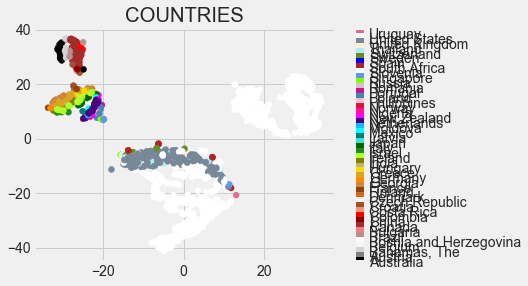

In [65]:
#Country

all_colors_countries = ['black', 'gray', 'lightgray', 'whitesmoke', 'snow', 'rosybrown', 'lightcoral', 'brown', 'darkred', 'red', 'darksalmon', 'sienna', 'seashell', 'chocolate', 'saddlebrown', 'peru', 'darkorange', 'goldenrod', 'gold', 'darkkhaki', 'olive', 'greenyellow', 'forestgreen', 'darkgreen', 'turquoise', 'teal', 'cyan', 'deepskyblue', 'indigo', 'fuchsia', 'deeppink', 'crimson', 'pink', 'steelblue', 'mediumvioletred', 'thistle', 'chartreuse', 'cornflowerblue', 'azure', 'firebrick', 'blue', 'olivedrab', 'paleturquoise', 'papayawhip', 'lightslategray', 'white', 'palevioletred']

x = X_embedded[:,0]
y = X_embedded[:,1]
label = countries_encoded
colors = all_colors_countries
# plt.figure(figsize=(50, 50), dpi=80)
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("COUNTRIES")
plt.savefig('countries_1.png')
#plot bar
colors = countries
cb = plt.colorbar()
loc = np.arange(0,max(label))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
# cb(fraction=10, pad=10)
plt.savefig('countries_2.png')

### State

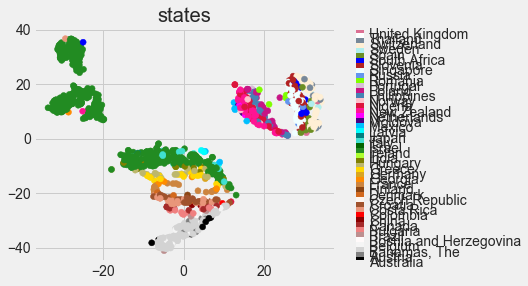

In [67]:
x = X_embedded[:,0]
y = X_embedded[:,1]
label = states_encoded
colors = all_colors_countries
# plt.figure(figsize=(50, 50), dpi=80)
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("states")
plt.savefig('countries_1.png')
#plot bar
colors = countries
cb = plt.colorbar()
loc = np.arange(0,max(label))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
# cb(fraction=10, pad=10)
plt.savefig('countries_2.png')

# Altered Dataset for improved t-SNE

### Preprocessing

In [79]:

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import math
import seaborn as sns



train_df = pd.read_csv('survey.csv')     #There is a header

# DATA PREPROCESSING: GENDER  
#Let's make other category based on entries existing less than 3 times
train_data = train_df.values
dictionary_entries_gender = dict()
other_str = []
#Iterate to count number of times each entry exists
for entry in train_data[:,2]:
    if entry in dictionary_entries_gender:
        dictionary_entries_gender[entry] += 1
    else:
        dictionary_entries_gender[entry] = 1
#Let's see frequency of each entry and then decide is we need ot make an "Other" category
#Final Gender entries based on results above
male_str = ['Male', 'Mal', 'Male (CIS)', 'Mail', 'Malr', 'Cis Man', 'M', 'male', 'm', 'maile', 'Cis Male', 'Make', 'Male ', "Man", 'msle', 'cis male']
female_str = ['Female', 'Cis Female', 'Femake', 'female', 'F', 'Woman', 'f', 'woman', 'Female ', 'cis-female/femme', 'Female (cis)', 'femail']
trans_str = ['Trans-female', 'Guy (-ish) ^_^', 'Trans woman', 'Male-ish', "something kinda male?", 'queer/she/they', "Female (trans)"]
other_str = ['All', 'Enby', 'Genderqueer', 'Androgyne', 'Agender', 'Neuter', 'Female (cis)', 'non-binary', 'Nah', 'fluid', 'male leaning androgynous', "queer", 'A little about you', 'p', 'ostensibly male, unsure what that really means']
#Let's process our data in the dataset 
for (row, col) in train_df.iterrows():

    if str(col.Gender) in male_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Male', inplace=True)

    if str(col.Gender) in female_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Female', inplace=True)

    if str(col.Gender) in trans_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Trans', inplace=True)

    if str(col.Gender) in other_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Other', inplace=True)
        
        
    
    
    
        
#DATA PREPROCESSING: AGE - run only once or you will get an error message
#Get the average age
train_data_ages = train_df.values
ages = train_data_ages[:,1]
count = 0 
index_to_remove = []
values_to_replace = []
for age in ages:
    if (age > 120) or (age < 16):
        index_to_remove.append(count)
        values_to_replace.append(age)
    count += 1
ages_cleaned = np.delete(ages, index_to_remove)
average_age = round(np.mean(ages_cleaned))




# COUNTRY 
country_str = ["United States", "United Kingdom", "Canada", "Germany"]
#Let's process our data in the dataset 
for (row, col) in train_df.iterrows():
    
    if str(col.Country) in country_str:
        pass
    else:
        train_df['Country'].replace(to_replace=col.Country, value='Other', inplace=True)

#DATA PREPROCESSING FOR ENCODING : need to change nan values or encoding wont work, found out the hard way :( 
for feature in train_df:
    if(train_df[feature].isnull().values.any()):
        train_df[feature] = train_df[feature].replace(np.nan, "NA")

from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
for feature in train_df:
    if (feature != "Age" and feature != "Timestamp"):
        le = LabelEncoder()
        le.fit(train_df[feature].unique())
        train_df[feature] = le.transform(train_df[feature])
    else:
        pass
countries_encoded = train_df["Country"].values  
train_df = train_df.loc[:, train_df.columns != 'Timestamp']
train_df = train_df.loc[:, train_df.columns != 'comments']
train_df = train_df.loc[:, train_df.columns != 'Country'] #remove
train_df = train_df.loc[:, train_df.columns != 'state'] #remove
train_df = train_df.loc[:, train_df.columns != 'Age'] #remove
#train_df= train_df.drop('comments', axis = 1)
train_df.head()

relevant_features = ["work_interfere", "family_history" , "tech_company", "treatment", "leave", "care_options", "Gender", "no_employees", "remote_work"]
all_colors = ['black', 'gray', 'lightgray', 'whitesmoke', 'snow', 'rosybrown', 'lightcoral', 'brown', 'darkred', 'red', 'darksalmon', 'sienna', 'seashell', 'chocolate', 'saddlebrown', 'peru', 'darkorange', 'goldenrod', 'gold', 'darkkhaki', 'olive', 'greenyellow', 'forestgreen', 'darkgreen', 'turquoise', 'teal', 'cyan', 'deepskyblue', 'indigo', 'fuchsia', 'deeppink', 'crimson', 'pink', 'steelblue', 'mediumvioletred', 'thistle', 'chartreuse', 'cornflowerblue', 'azure', 'firebrick', 'blue', 'olivedrab', 'paleturquoise', 'papayawhip', 'lightslategray', 'rebeccapurple', 'palevioletred']
all_colors_countries = ['black', 'gray', 'lightgray', 'whitesmoke', 'snow', 'rosybrown', 'lightcoral', 'brown', 'darkred', 'red', 'darksalmon', 'sienna', 'seashell', 'chocolate', 'saddlebrown', 'peru', 'darkorange', 'goldenrod', 'gold', 'darkkhaki', 'olive', 'greenyellow', 'forestgreen', 'darkgreen', 'turquoise', 'teal', 'cyan', 'deepskyblue', 'indigo', 'fuchsia', 'deeppink', 'crimson', 'pink', 'steelblue', 'mediumvioletred', 'thistle', 'chartreuse', 'cornflowerblue', 'azure', 'firebrick', 'blue', 'olivedrab', 'paleturquoise', 'papayawhip', 'lightslategray', 'black', 'palevioletred']
states = sorted(['IL', 'IN', 'NA', 'TX', 'TN', 'MI', 'OH', 'CA', 'CT', 'MD', 'NY', 'NC', 'MA', 'IA', 'PA',
 'WA', 'WI', 'UT', 'NM', 'OR', 'FL', 'MN', 'MO', 'AZ', 'CO', 'GA', 'DC', 'NE', 'WV',
 'OK', 'KS', 'VA', 'NH', 'KY', 'AL', 'NV', 'NJ', 'SC', 'VT', 'SD', 'ID', 'MS', 'RI',
 'WY', 'LA', 'ME'])

train_df.head()

KeyError: 'Age'

### Country

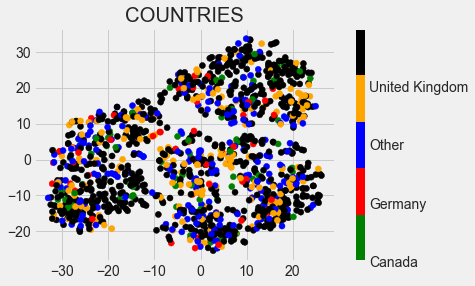

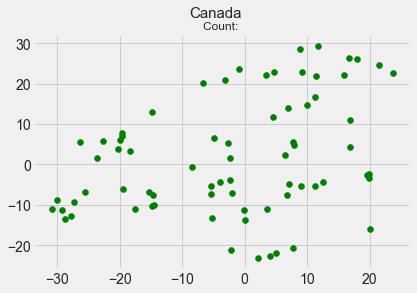

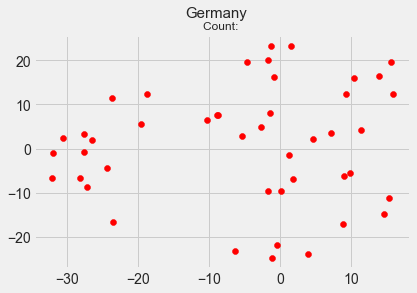

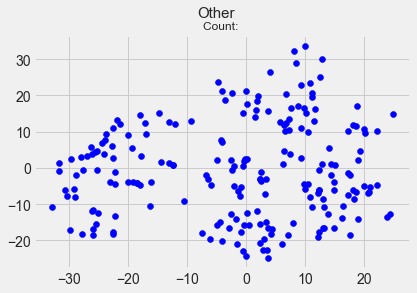

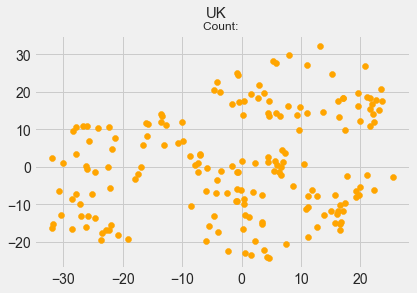

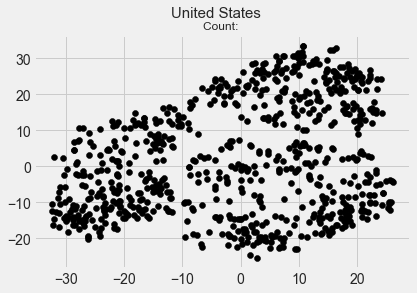

In [77]:
#Country
x_input = train_df.values # ALL DATA, TOP 6 FEATURES
X_embedded = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x = X_embedded[:,0]
y = X_embedded[:,1]
label = countries_encoded
colors = ["green", "red", "blue", "orange", "black"]
# plt.figure(figsize=(50, 50), dpi=80)
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("COUNTRIES")
plt.savefig('countries_1.png')
#plot bar
colors = ['Canada', 'Germany', 'Other', 'United Kingdom', 'United States']
cb = plt.colorbar()
loc = np.arange(0,max(label))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.savefig('countries_2.png')
plt.show()

#Canada
Canada_X = []
count = 0
for entry in label:
    if(entry == 0):
        Canada_X.append(X_embedded[count])
    count += 1
    
Canada_X = np.array(Canada_X)
x = Canada_X[:,0]
y = Canada_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Canada", fontsize = 15)
plt.title("Count: ", fontsize=12)
plt.show()


#Germany
Germany_X = []
count = 0
for entry in label:
    if(entry == 1):
        Germany_X.append(X_embedded[count])
    count += 1
    
Germany_X = np.array(Germany_X)
x = Germany_X[:,0]
y = Germany_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Germany", fontsize = 15)
plt.title("Count: ", fontsize=12)
plt.show()

#Other
Other_X = []
count = 0
for entry in label:
    if(entry == 2):
        Other_X.append(X_embedded[count])
    count += 1
    
Other_X = np.array(Other_X)
x = Other_X[:,0]
y = Other_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Other", fontsize = 15)
plt.title("Count: ", fontsize=12)
plt.show()

#United Kingdom
UK_X = []
count = 0
for entry in label:
    if(entry == 3):
        UK_X.append(X_embedded[count])
    count += 1
    
UK_X = np.array(UK_X)
x = UK_X[:,0]
y = UK_X[:,1]
plt.scatter(x, y, c='orange')
plt.suptitle("UK", fontsize = 15)
plt.title("Count: ", fontsize=12)
plt.show()

#United States
US_X = []
count = 0
for entry in label:
    if(entry == 4):
        US_X.append(X_embedded[count])
    count += 1
    
US_X = np.array(US_X)
x = US_X[:,0]
y = US_X[:,1]
plt.scatter(x, y, c='black')
plt.suptitle("United States", fontsize = 15)
plt.title("Count: ", fontsize=12)
plt.show()


### All relevant features

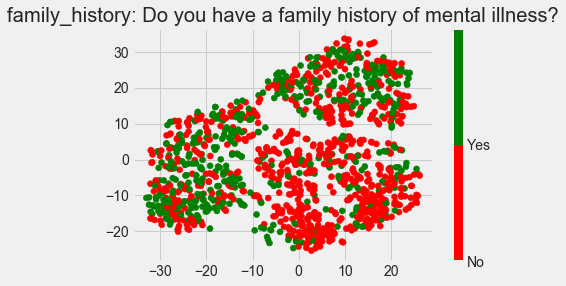

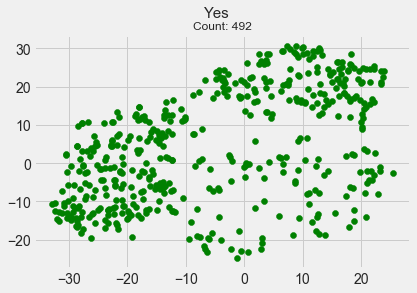

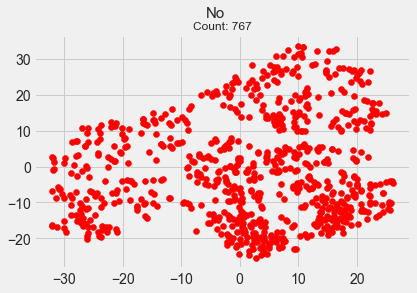

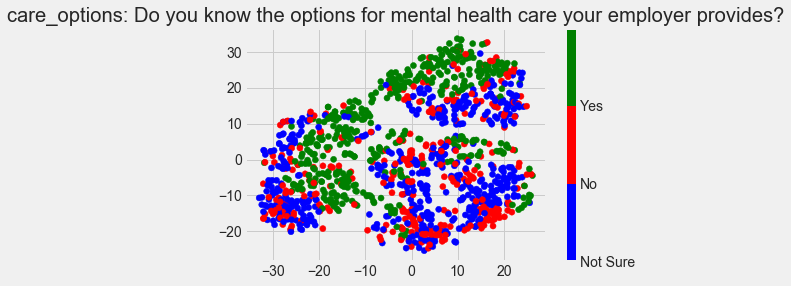

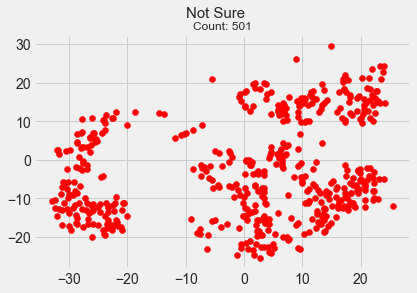

501


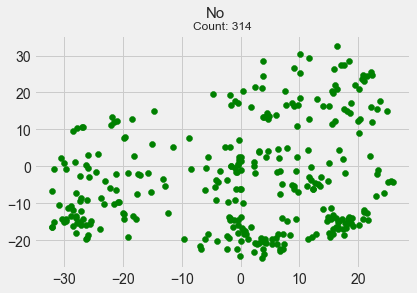

314


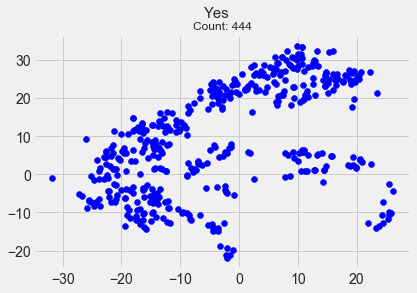

444
[0 1 2 3 4]
[2 3 3 2 1 4 4 1 4 1 4 1 4 1 1 3 4 4 4 0 4 1 2 1 3 4 0 3 4 4 1 3 4 4 4 3 3
 0 0 3 4 0 4 2 4 4 0 0 4 3 2 0 0 1 0 3 0 4 0 2 4 4 1 0 4 4 2 4 0 3 1 1 3 0
 1 0 0 4 4 1 4 1 1 2 1 0 2 3 4 0 1 4 0 0 4 1 3 4 4 2]


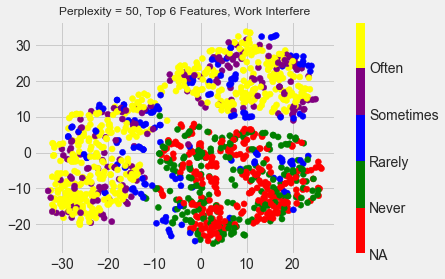

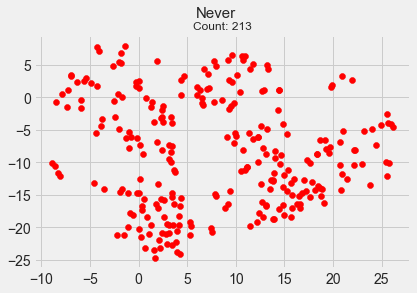

264


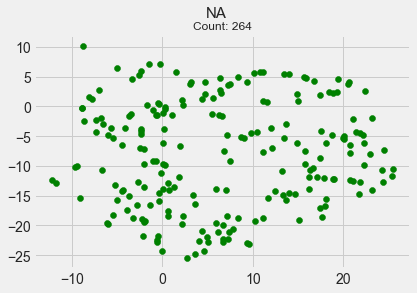

213


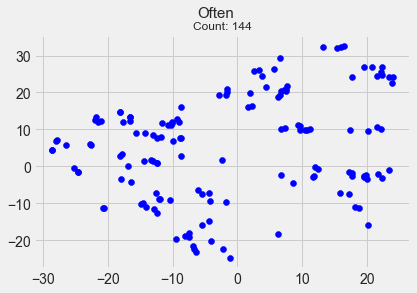

144


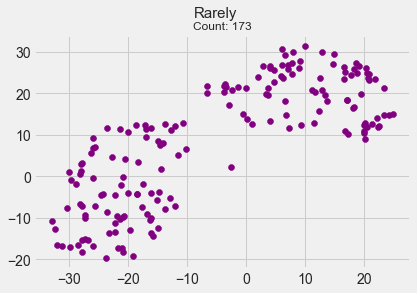

173


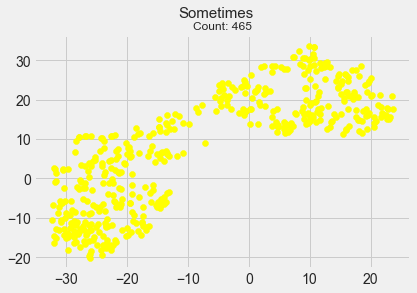

465
[0 1 2 3 4 5]
[4 5 4 2 1 4 0 0 1 2 4 1 2 3 4 2 2 4 0 4 1 0 2 5 2 5 0 4 2 4 4 0 3 2 0 4 0
 1 1 5 4 5 0 4 2 2 2 4 0 2 4 1 1 0 1 2 4 2 2 4 5 2 1 2 4 5 0 1 2 0 2 4 5 2
 5 0 5 0 2 4 1 2 2 0 5 2 4 3 2 3 3 2 2 2 2 2 2 4 4 0]


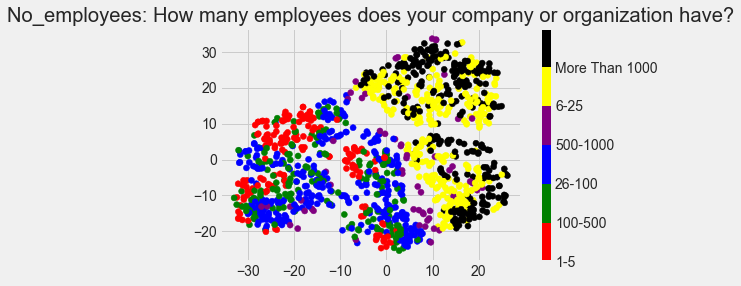

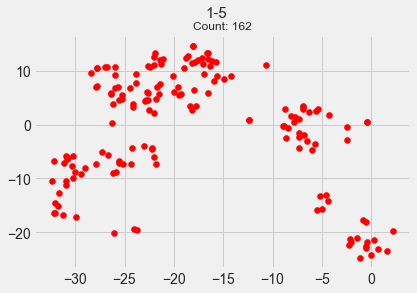

162


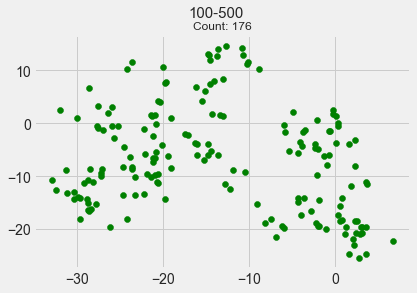

176


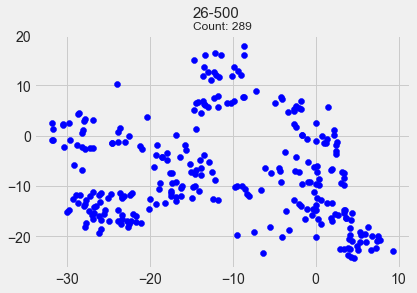

289


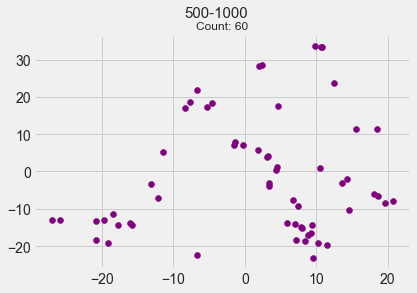

60


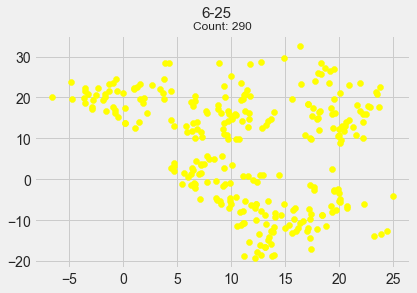

290


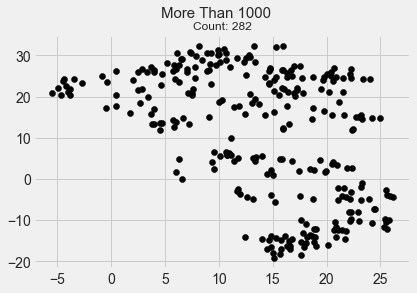

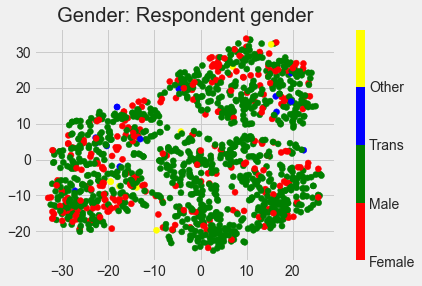

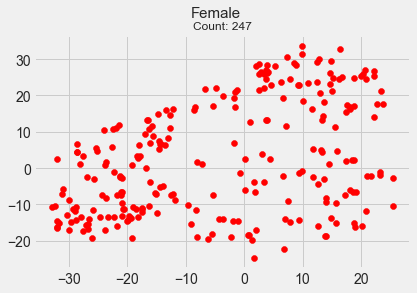

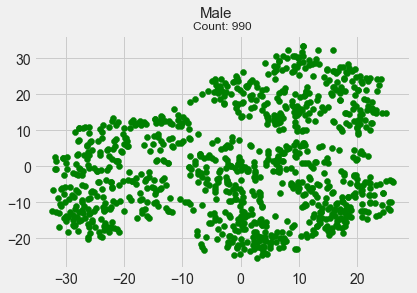

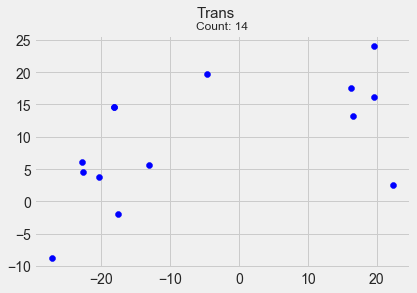

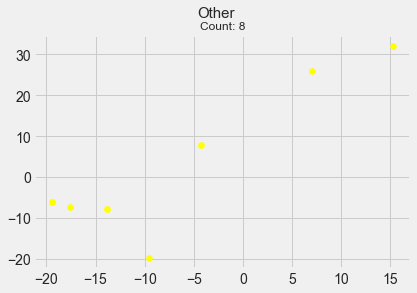

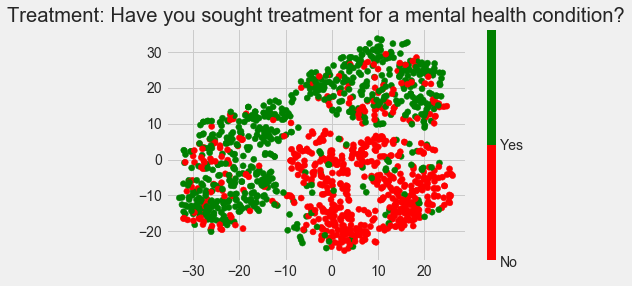

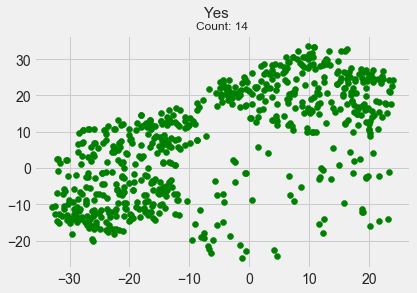

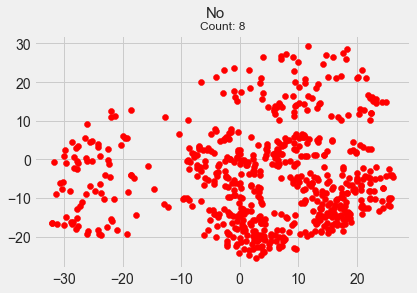

[2 0 1 ... 1 0 0]
[0 1 2 3 4]


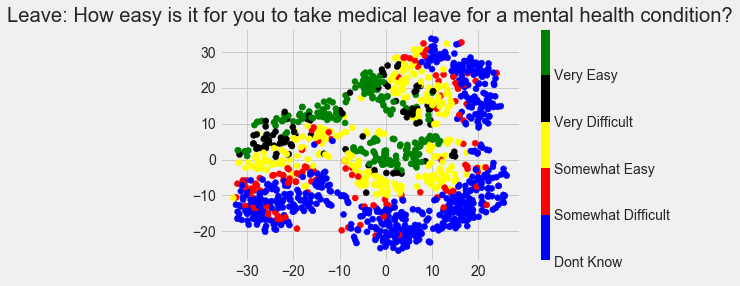

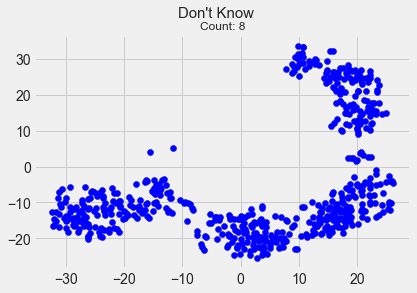

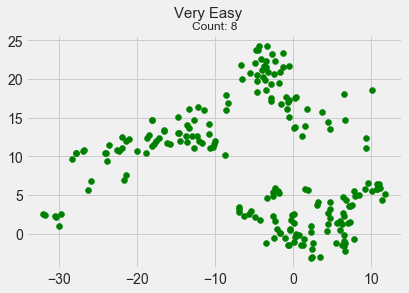

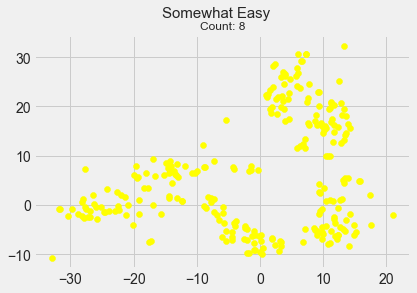

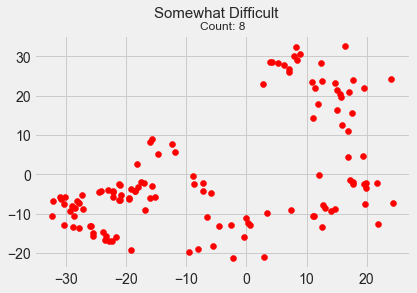

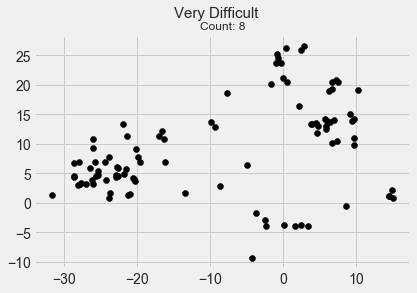

[1 0 1 ... 1 1 0]
[0 1]


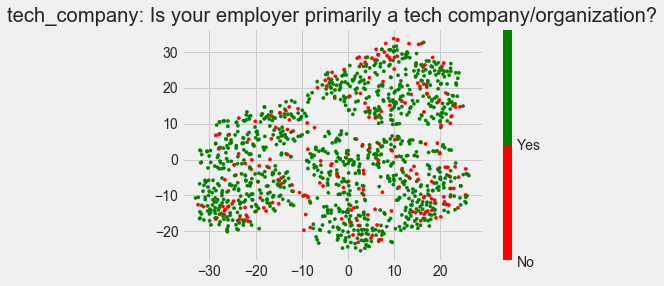

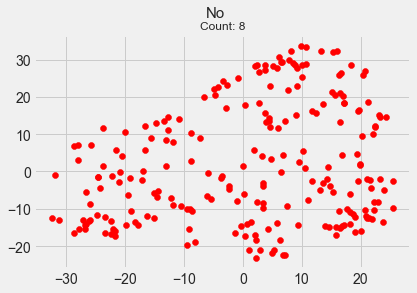

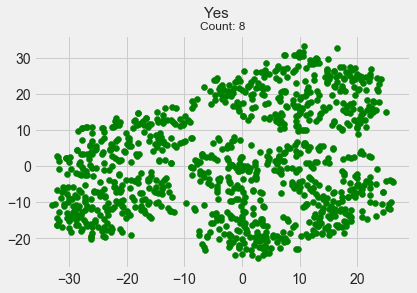

[0 1]


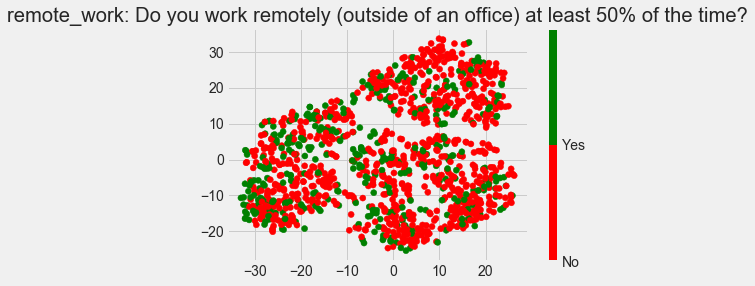

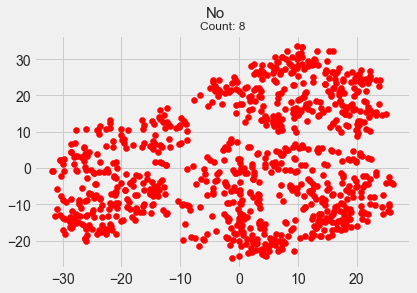

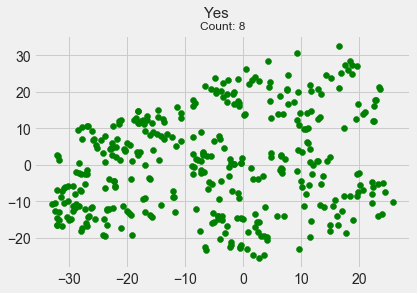

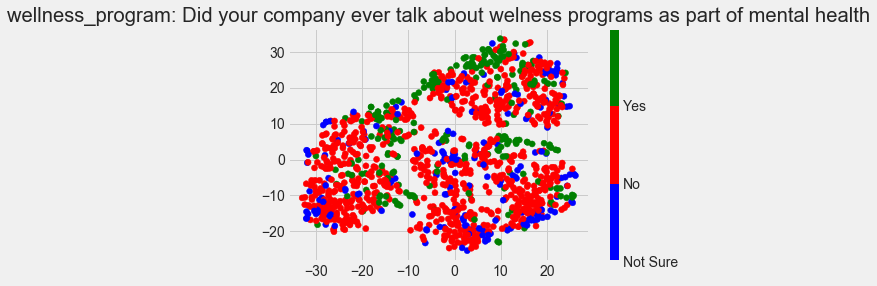

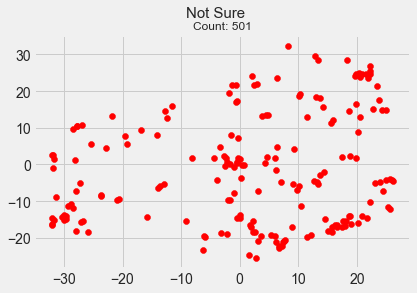

188


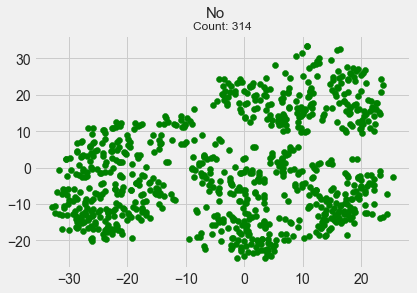

842


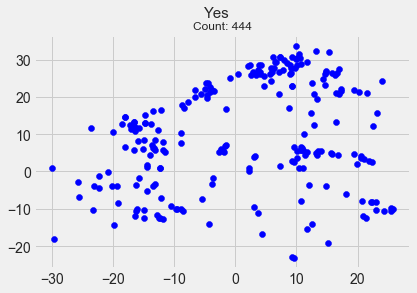

229


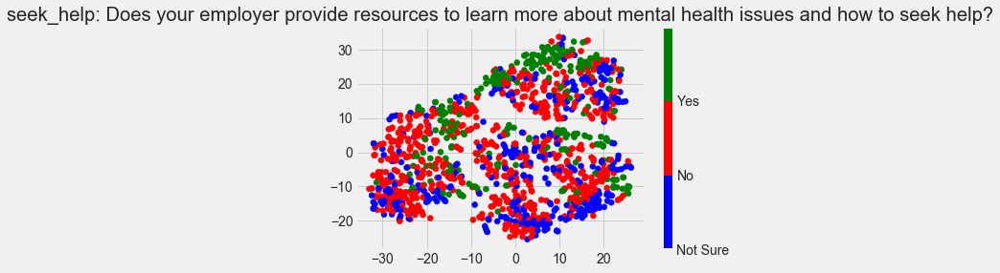

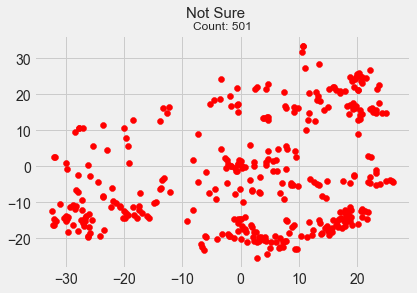

363


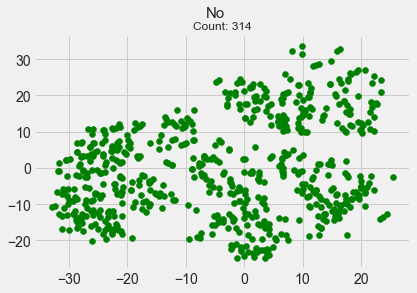

646


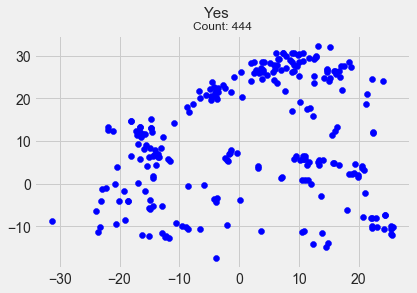

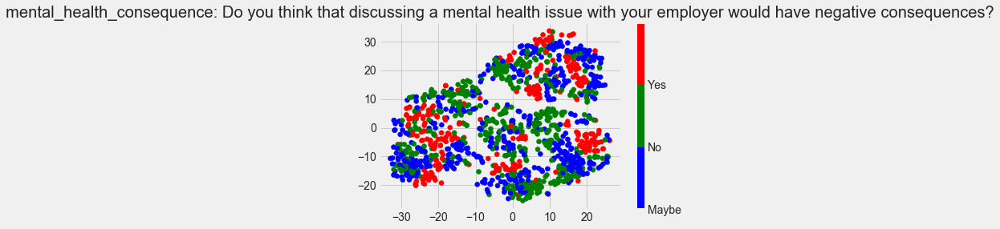

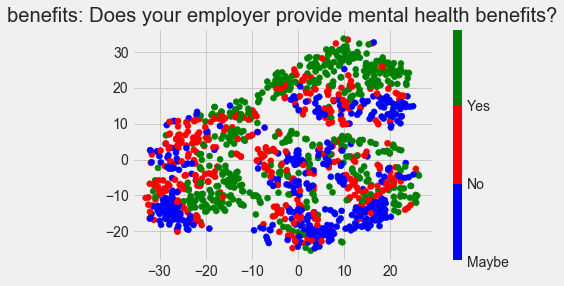

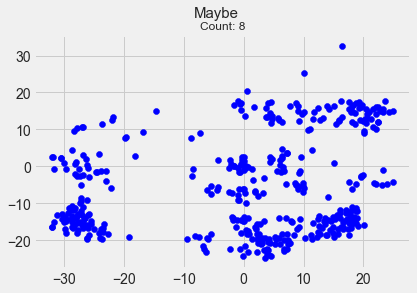

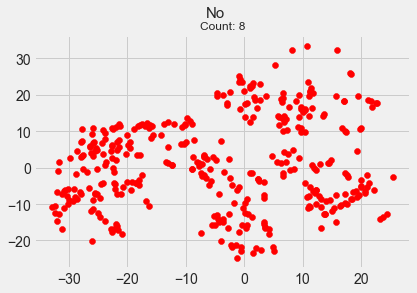

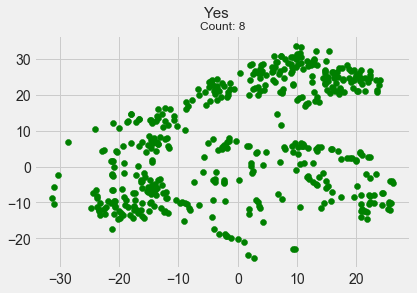

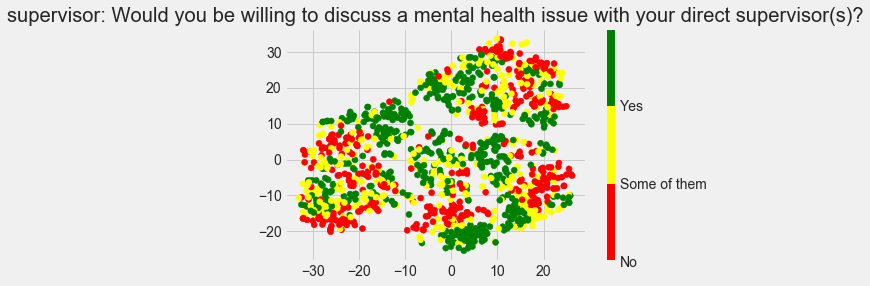

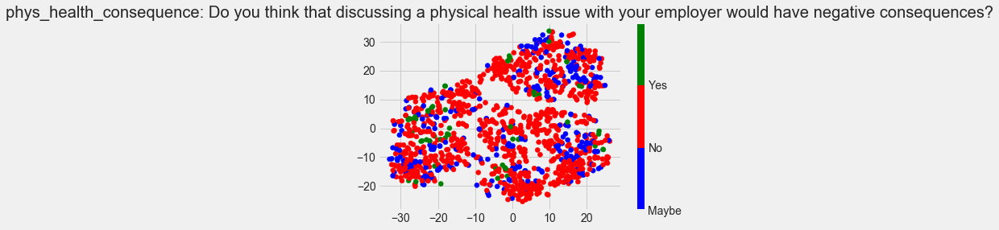

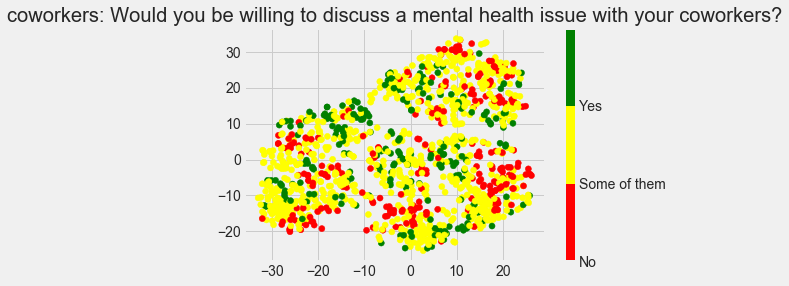

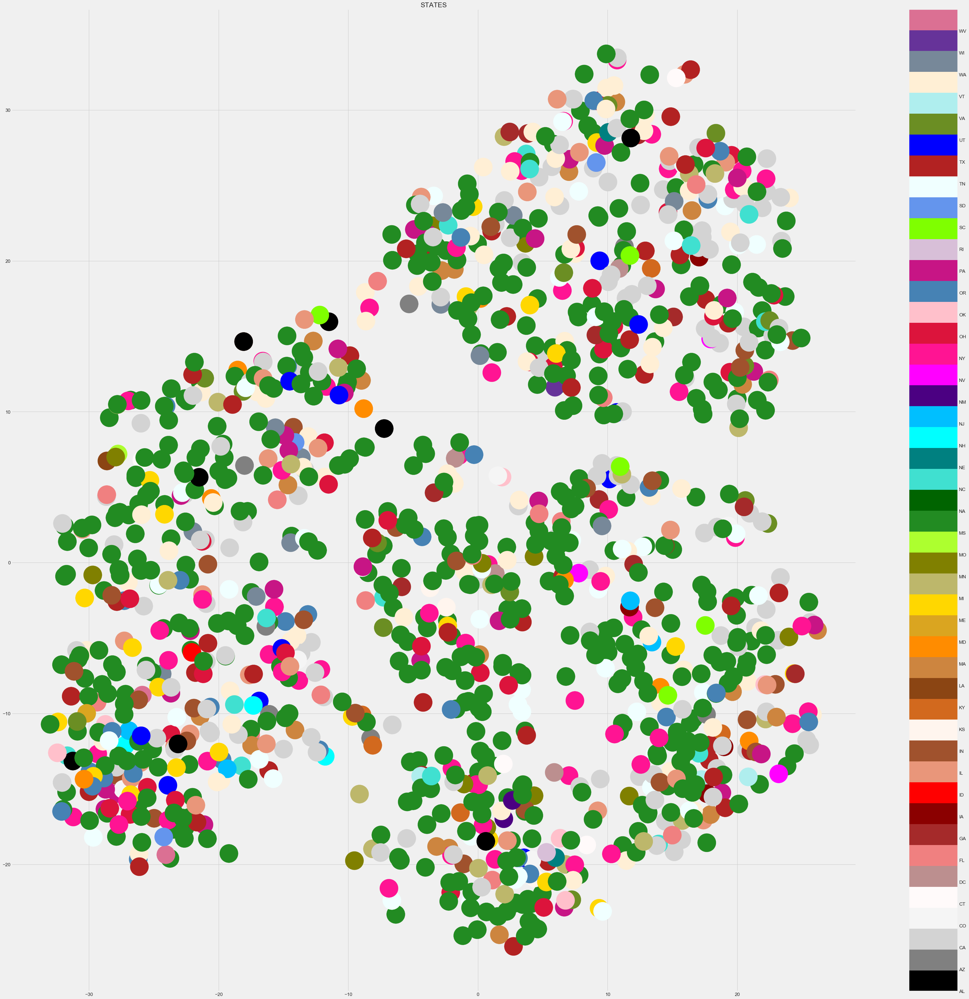

In [81]:
from sklearn.manifold import TSNE
from scipy.stats import gaussian_kde
import matplotlib
# relevant_features = ["work_interfere", "family_history" , "Age", "Country", "state", "care_options", "no_employees"]
# relevant_features = ["work_interfere", "family_history", "care_options", "no_employees"]
# relevant_features = ["work_interfere", "family_history", "leave", "care_options", "no_employees"]
# relevant_features = ["work_interfere", "family_history" , "tech_company", "treatment", "leave", "care_options", "Gender", "no_employees"]
relevant_features = ["work_interfere", "family_history" , "tech_company", "treatment", "leave", "care_options", "Gender", "no_employees", "remote_work", "benefits", "wellness_program", "seek_help", "mental_health_consequence", "supervisor", "coworkers", "phys_health_consequence"]
#                            1                 2               3                4 .      5 .           6            7           8                 9          10                  11          12            13                             14           15
x_input = train_df.values # ALL DATA, TOP 6 FEATURES




#FAMILY HISTORY
# X_embedded_New = TSNE(n_components=2, perplexity = 50).fit_transform(x_input)
x_input = train_df[relevant_features].values # ALL DATA, TOP 6 FEATURES
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,1]
colors = ['red','green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you have a family history of mental illness?", fontsize = 15)
plt.title("family_history: Do you have a family history of mental illness?")
colors = ['No','Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()

#GREEN
yes_X = []
count = 0
for entry in label:
    if(entry):
        yes_X.append(X_embedded[count])
    count += 1
yes_X = np.array(yes_X)
x = yes_X[:,0]
y = yes_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 492", fontsize=12)
plt.show()


#RED
no_X = []
count = 0
for entry in label:
    if(entry == 0):
        no_X.append(X_embedded[count])
    count += 1
    
no_X = np.array(no_X)
x = no_X[:,0]
y = no_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 767", fontsize=12)
plt.show()








### CARE OPTIONS
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,5]
colors = ['blue','red', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("care_options: Do you know the options for mental health care your employer provides?")
colors = ['Not Sure','No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()

#NOT SURE
Not_Sure_X = []
count = 0
for entry in label:
    if(entry == 0):
        Not_Sure_X.append(X_embedded[count])
    count += 1

#print(yes_X)
Not_Sure_X = np.array(Not_Sure_X)
x = Not_Sure_X[:,0]
y = Not_Sure_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Not Sure", fontsize = 15)
plt.title("Count: 501", fontsize=12)
plt.show()
print(len(Not_Sure_X))

#NO
no_X = []
count = 0
for entry in label:
    if(entry == 1):
        no_X.append(X_embedded[count])
    count += 1
    
no_X = np.array(no_X)
x = no_X[:,0]
y = no_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 314", fontsize=12)
plt.show()
print(len(no_X))

#YES
Yes_X = []
count = 0
for entry in label:
    if(entry == 2):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 444", fontsize=12)
plt.show()
print(len(Yes_X))












### WORK INTERFERE
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,0]
print(np.unique(label))
print(label[:100])
colors = ['red','green', 'blue', 'purple', 'yellow']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("Work_Interfere: If you have a mental health condition, do you feel that it interferes with your work?")
# plt.suptitle("If you have a mental health condition, do you feel that it interferes with your work?", fontsize = 15)
plt.title("Perplexity = 50, Top 6 Features, Work Interfere", fontsize=12)

colors = ['NA', 'Never' , 'Rarely', 'Sometimes', 'Often'] 
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)

plt.show()

#NEVER
Never_X = []
count = 0
for entry in label:
    if(entry == 0):
        Never_X.append(X_embedded[count])
    count += 1
    
Never_X = np.array(Never_X)
x = Never_X[:,0]
y = Never_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Never", fontsize = 15)
plt.title("Count: 213", fontsize=12)
plt.show()
print(len(Never_X))

#NA
NA_X = []
count = 0
for entry in label:
    if(entry == 1):
        NA_X.append(X_embedded[count])
    count += 1
    
NA_X = np.array(NA_X)
x = NA_X[:,0]
y = NA_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("NA", fontsize = 15)
plt.title("Count: 264", fontsize=12)
plt.show()
print(len(NA_X))

#Often
Often_X = []
count = 0
for entry in label:
    if(entry == 2):
        Often_X.append(X_embedded[count])
    count += 1
    
Often_X = np.array(Often_X)
x = Often_X[:,0]
y = Often_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Often", fontsize = 15)
plt.title("Count: 144", fontsize=12)
plt.show()
print(len(Often_X))

#Rarely
Rarely_X = []
count = 0
for entry in label:
    if(entry == 3):
        Rarely_X.append(X_embedded[count])
    count += 1
    
Rarely_X = np.array(Rarely_X)
x = Rarely_X[:,0]
y = Rarely_X[:,1]
plt.scatter(x, y, c='purple')
plt.suptitle("Rarely", fontsize = 15)
plt.title("Count: 173", fontsize=12)
plt.show()
print(len(Rarely_X))

#Sometimes
Sometimes_X = []
count = 0
for entry in label:
    if(entry == 4):
        Sometimes_X.append(X_embedded[count])
    count += 1
    
Sometimes_X = np.array(Sometimes_X)
x = Sometimes_X[:,0]
y = Sometimes_X[:,1]
plt.scatter(x, y, c='yellow')
plt.suptitle("Sometimes", fontsize = 15)
plt.title("Count: 465", fontsize=12)
plt.show()
print(len(Sometimes_X))













### .   Number of Employees
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,7]
print(np.unique(label))
colors = ['red','green', 'blue', 'purple', 'yellow', 'black']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("What is the size of the company that you work at?", fontsize = 15)
plt.title("No_employees: How many employees does your company or organization have?")
print(label[:100])
colors = ['1-5','100-500', '26-100', '500-1000', '6-25', 'More Than 1000']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)

plt.show()



#1-5
One_to_Five_X = []
count = 0
for entry in label:
    if(entry == 0):
        One_to_Five_X.append(X_embedded[count])
    count += 1
    
One_to_Five_X = np.array(One_to_Five_X)
x = One_to_Five_X[:,0]
y = One_to_Five_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("1-5", fontsize = 15)
plt.title("Count: 162", fontsize=12)
plt.show()
print(len(One_to_Five_X))

#100-500
One_to_Five_Hundred_X = []
count = 0
for entry in label:
    if(entry == 1):
        One_to_Five_Hundred_X.append(X_embedded[count])
    count += 1
    
One_to_Five_Hundred_X = np.array(One_to_Five_Hundred_X)
x = One_to_Five_Hundred_X[:,0]
y = One_to_Five_Hundred_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("100-500", fontsize = 15)
plt.title("Count: 176", fontsize=12)
plt.show()
print(len(One_to_Five_Hundred_X))

#26-500
two_six_five_hundred_X = []
count = 0
for entry in label:
    if(entry == 2):
        two_six_five_hundred_X.append(X_embedded[count])
    count += 1
    
two_six_five_hundred_X = np.array(two_six_five_hundred_X)
x = two_six_five_hundred_X[:,0]
y = two_six_five_hundred_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("26-500", fontsize = 15)
plt.title("Count: 289", fontsize=12)
plt.show()
print(len(two_six_five_hundred_X))

#500-1000
to_one_thousand_X = []
count = 0
for entry in label:
    if(entry == 3):
        to_one_thousand_X.append(X_embedded[count])
    count += 1
    
to_one_thousand_X = np.array(to_one_thousand_X)
x = to_one_thousand_X[:,0]
y = to_one_thousand_X[:,1]
plt.scatter(x, y, c='purple')
plt.suptitle("500-1000", fontsize = 15)
plt.title("Count: 60", fontsize=12)
plt.show()
print(len(to_one_thousand_X))

#6-25
six_to_two_five = []
count = 0
for entry in label:
    if(entry == 4):
        six_to_two_five.append(X_embedded[count])
    count += 1
    
six_to_two_five = np.array(six_to_two_five)
x = six_to_two_five[:,0]
y = six_to_two_five[:,1]
plt.scatter(x, y, c='yellow')
plt.suptitle("6-25", fontsize = 15)
plt.title("Count: 290", fontsize=12)
plt.show()
print(len(six_to_two_five))


#More Than 1000
one_Thousand_plus = []
count = 0
for entry in label:
    if(entry == 5):
        one_Thousand_plus.append(X_embedded[count])
    count += 1
    
one_Thousand_plus = np.array(one_Thousand_plus)
x = one_Thousand_plus[:,0]
y = one_Thousand_plus[:,1]
plt.scatter(x, y, c='black')
plt.suptitle("More Than 1000", fontsize = 15)
plt.title("Count: 282", fontsize=12)
plt.show()
















### Gender
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,6]
colors = ['red','green', 'blue', 'yellow']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("Gender: Respondent gender")
#plot bar
colors = ['Female','Male', 'Trans', 'Other']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()

#Female
Female_X = []
count = 0
for entry in label:
    if(entry == 0):
        Female_X.append(X_embedded[count])
    count += 1
    
Female_X = np.array(Female_X)
x = Female_X[:,0]
y = Female_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Female", fontsize = 15)
plt.title("Count: 247", fontsize=12)
plt.show()

#Male
Male_X = []
count = 0
for entry in label:
    if(entry == 1):
        Male_X.append(X_embedded[count])
    count += 1
    
Male_X = np.array(Male_X)
x = Male_X[:,0]
y = Male_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Male", fontsize = 15)
plt.title("Count: 990", fontsize=12)
plt.show()


#Trans
Trans_X = []
count = 0
for entry in label:
    if(entry == 2):
        Trans_X.append(X_embedded[count])
    count += 1
    
Trans_X = np.array(Trans_X)
x = Trans_X[:,0]
y = Trans_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Trans", fontsize = 15)
plt.title("Count: 14", fontsize=12)
plt.show()

#Other
Other_X = []
count = 0
for entry in label:
    if(entry == 3):
        Other_X.append(X_embedded[count])
    count += 1
    
Other_X = np.array(Other_X)
x = Other_X[:,0]
y = Other_X[:,1]
plt.scatter(x, y, c='yellow')
plt.suptitle("Other", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()






















###Treatment
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,3]
colors = ['red','green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("Treatment: Have you sought treatment for a mental health condition?")
#plot bar
colors = ['No','Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()


#Yes
Yes_Treatment_X = []
count = 0
for entry in label:
    if(entry == 1):
        Yes_Treatment_X.append(X_embedded[count])
    count += 1
    
Yes_Treatment_X = np.array(Yes_Treatment_X)
x = Yes_Treatment_X[:,0]
y = Yes_Treatment_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 14", fontsize=12)
plt.show()

#No
No_Treatment_X = []
count = 0
for entry in label:
    if(entry == 0):
        No_Treatment_X.append(X_embedded[count])
    count += 1
    
No_Treatment_X = np.array(No_Treatment_X)
x = No_Treatment_X[:,0]
y = No_Treatment_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()









###Leave
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,4]
print(label)
print(np.unique(label))
colors = ['blue','red', 'yellow', 'black', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("Leave: How easy is it for you to take medical leave for a mental health condition?")
#plot bar
colors = ['Dont Know','Somewhat Difficult', 'Somewhat Easy', 'Very Difficult', 'Very Easy']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()


#NA
NA_X = []
count = 0
for entry in label:
    if(entry == 0):
        NA_X.append(X_embedded[count])
    count += 1
    
NA_X = np.array(NA_X)
x = NA_X[:,0]
y = NA_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Don't Know", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Very Easy
Very_Easy_X = []
count = 0
for entry in label:
    if(entry == 4):
        Very_Easy_X.append(X_embedded[count])
    count += 1
    
Very_Easy_X = np.array(Very_Easy_X)
x = Very_Easy_X[:,0]
y = Very_Easy_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Very Easy", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Somewhat Easy
Somewhat_Easy_X = []
count = 0
for entry in label:
    if(entry == 2):
        Somewhat_Easy_X.append(X_embedded[count])
    count += 1
    
Somewhat_Easy_X = np.array(Somewhat_Easy_X)
x = Somewhat_Easy_X[:,0]
y = Somewhat_Easy_X[:,1]
plt.scatter(x, y, c='yellow')
plt.suptitle("Somewhat Easy", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Somewhat Difficlt
Somewhat_Difficult_X = []
count = 0
for entry in label:
    if(entry == 1):
        Somewhat_Difficult_X.append(X_embedded[count])
    count += 1
    
Somewhat_Difficult_X = np.array(Somewhat_Difficult_X)
x = Somewhat_Difficult_X[:,0]
y = Somewhat_Difficult_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Somewhat Difficult", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Very Difficlt
Very_Difficult_X = []
count = 0
for entry in label:
    if(entry == 3):
        Very_Difficult_X.append(X_embedded[count])
    count += 1
    
Very_Difficult_X = np.array(Very_Difficult_X)
x = Very_Difficult_X[:,0]
y = Very_Difficult_X[:,1]
plt.scatter(x, y, c='black')
plt.suptitle("Very Difficult", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
















###tech_company
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,2]
print(label)
print(np.unique(label))
colors = ['red','green']
plt.scatter(x, y, s = 10, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("tech_company: Is your employer primarily a tech company/organization?")
#plot bar
colors = ['No','Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()
#No
No_X = []
count = 0
for entry in label:
    if(entry == 0):
        No_X.append(X_embedded[count])
    count += 1
    
No_X = np.array(No_X)
x = No_X[:,0]
y = No_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Yes
#No
Yes_X = []
count = 0
for entry in label:
    if(entry == 1):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()







































###Remote Work
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,8]
print(np.unique(label))
colors = ['red','green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("remote_work: Do you work remotely (outside of an office) at least 50% of the time?")
colors = ['No', 'Yes'] 
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()
#No
No_X = []
count = 0
for entry in label:
    if(entry == 0):
        No_X.append(X_embedded[count])
    count += 1
    
No_X = np.array(No_X)
x = No_X[:,0]
y = No_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Yes
Yes_X = []
count = 0
for entry in label:
    if(entry == 1):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()











#GOOD
###                                                                         Wellness Program
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,10]
colors = ['blue','red', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("wellness_program: Did your company ever talk about welness programs as part of mental health")
colors = ['Not Sure','No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()

#NOT SURE
Not_Sure_X = []
count = 0
for entry in label:
    if(entry == 0):
        Not_Sure_X.append(X_embedded[count])
    count += 1

#print(yes_X)
Not_Sure_X = np.array(Not_Sure_X)
x = Not_Sure_X[:,0]
y = Not_Sure_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Not Sure", fontsize = 15)
plt.title("Count: 501", fontsize=12)
plt.show()
print(len(Not_Sure_X))

#NO
no_X = []
count = 0
for entry in label:
    if(entry == 1):
        no_X.append(X_embedded[count])
    count += 1
    
no_X = np.array(no_X)
x = no_X[:,0]
y = no_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 314", fontsize=12)
plt.show()
print(len(no_X))

#YES
Yes_X = []
count = 0
for entry in label:
    if(entry == 2):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 444", fontsize=12)
plt.show()
print(len(Yes_X))













#GOOD
###                   seek help
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,11]
colors = ['blue','red', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("seek_help: Does your employer provide resources to learn more about mental health issues and how to seek help?")
colors = ['Not Sure','No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()

#NOT SURE
Not_Sure_X = []
count = 0
for entry in label:
    if(entry == 0):
        Not_Sure_X.append(X_embedded[count])
    count += 1

#print(yes_X)
Not_Sure_X = np.array(Not_Sure_X)
x = Not_Sure_X[:,0]
y = Not_Sure_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("Not Sure", fontsize = 15)
plt.title("Count: 501", fontsize=12)
plt.show()
print(len(Not_Sure_X))

#NO
no_X = []
count = 0
for entry in label:
    if(entry == 1):
        no_X.append(X_embedded[count])
    count += 1
    
no_X = np.array(no_X)
x = no_X[:,0]
y = no_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 314", fontsize=12)
plt.show()
print(len(no_X))

#YES
Yes_X = []
count = 0
for entry in label:
    if(entry == 2):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 444", fontsize=12)
plt.show()

















#GOOD
### Mental Health Consequences
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,12]
colors = ['blue','green', 'red']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("mental_health_consequence: Do you think that discussing a mental health issue with your employer would have negative consequences?")
colors = ['Maybe','No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()
















#GOOD
### Benefits  
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,9]
colors = ['blue','red', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("benefits: Does your employer provide mental health benefits?")
colors = ['Maybe','No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()
#Maybe
Maybe_X = []
count = 0
for entry in label:
    if(entry == 0):
        Maybe_X.append(X_embedded[count])
    count += 1
    
Maybe_X = np.array(Maybe_X)
x = Maybe_X[:,0]
y = Maybe_X[:,1]
plt.scatter(x, y, c='blue')
plt.suptitle("Maybe", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#No
No_X = []
count = 0
for entry in label:
    if(entry == 1):
        No_X.append(X_embedded[count])
    count += 1
    
No_X = np.array(No_X)
x = No_X[:,0]
y = No_X[:,1]
plt.scatter(x, y, c='red')
plt.suptitle("No", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()
#Yes
#No
Yes_X = []
count = 0
for entry in label:
    if(entry == 2):
        Yes_X.append(X_embedded[count])
    count += 1
    
Yes_X = np.array(Yes_X)
x = Yes_X[:,0]
y = Yes_X[:,1]
plt.scatter(x, y, c='green')
plt.suptitle("Yes", fontsize = 15)
plt.title("Count: 8", fontsize=12)
plt.show()









### supervisor  
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,13]
colors = ['red','yellow', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("supervisor: Would you be willing to discuss a mental health issue with your direct supervisor(s)?")
colors = ['No', 'Some of them', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()










### phys_health_consequence  
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,15]
colors = ['blue','red', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("phys_health_consequence: Do you think that discussing a physical health issue with your employer would have negative consequences?")
colors = ['Maybe', 'No', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()











### coworkers  
x = X_embedded[:,0]
y = X_embedded[:,1]
label = x_input[:,14]
colors = ['red','yellow', 'green']
plt.scatter(x, y, c=label, cmap = matplotlib.colors.ListedColormap(colors))
# plt.suptitle("Do you know the options for mental health care your employer provides?", fontsize = 15)
plt.title("coworkers: Would you be willing to discuss a mental health issue with your coworkers?")
colors = ['No', 'Some of them', 'Yes']
cb = plt.colorbar()
loc = np.arange(0,max(label),max(label)/float(len(colors)))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
plt.show()














### State
x = X_embedded[:,0]
y = X_embedded[:,1]
label = states_encoded
colors = all_colors
plt.figure(figsize=(50, 50), dpi=80)
plt.scatter(x, y, s = 3000, c=label, cmap = matplotlib.colors.ListedColormap(colors))
plt.title("STATES")
plt.savefig('states_1.png')
#plot bar
colors = states
cb = plt.colorbar()
loc = np.arange(0,max(label))
cb.set_ticks(loc)
cb.set_ticklabels(colors)
# cb(fraction=10, pad=10)
plt.savefig('states_2.png')



# Further Analysis

### To do a deeper dive we are going to work with the original dataset, unaltered by encoding or other needs

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import math
import seaborn as sns



train_df = pd.read_csv('survey.csv')     #There is a header
# DATA PREPROCESSING: GENDER  

#Let's make other category based on entries existing less than 3 times
train_data = train_df.values
dictionary_entries_gender = dict()
other_str = []
#Iterate to count number of times each entry exists
for entry in train_data[:,2]:
    if entry in dictionary_entries_gender:
        dictionary_entries_gender[entry] += 1
    else:
        dictionary_entries_gender[entry] = 1

#Let's see frequency of each entry and then decide is we need ot make an "Other" category
#print(dictionary_entries_gender)

#Final Gender entries based on results above
male_str = ['Male', 'Mal', 'Male (CIS)', 'Mail', 'Malr', 'Cis Man', 'M', 'male', 'm', 'maile', 'Cis Male', 'Make', 'Male ', "Man", 'msle', 'cis male']
female_str = ['Female', 'Cis Female', 'Femake', 'female', 'F', 'Woman', 'f', 'woman', 'Female ', 'cis-female/femme', 'Female (cis)', 'femail']
trans_str = ['Trans-female', 'Guy (-ish) ^_^', 'Trans woman', 'Male-ish', "something kinda male?", 'queer/she/they', "Female (trans)"]
other_str = ['All', 'Enby', 'Genderqueer', 'Androgyne', 'Agender', 'Neuter', 'Female (cis)', 'non-binary', 'Nah', 'fluid', 'male leaning androgynous', "queer", 'A little about you', 'p', 'ostensibly male, unsure what that really means']
#Let's process our data in the dataset 
for (row, col) in train_df.iterrows():

    if str(col.Gender) in male_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Male', inplace=True)

    if str(col.Gender) in female_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Female', inplace=True)

    if str(col.Gender) in trans_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Trans', inplace=True)

    if str(col.Gender) in other_str:
        train_df['Gender'].replace(to_replace=col.Gender, value='Other', inplace=True)

print(np.unique(train_df['Gender']))
#DATA PREPROCESSING: AGE - run only once or you will get an error message
#Get the average age
train_data_ages = train_df.values
ages = train_data_ages[:,1]
count = 0 
index_to_remove = []
values_to_replace = []
for age in ages:
    if (age > 120) or (age < 16):
        index_to_remove.append(count)
        values_to_replace.append(age)
    count += 1
ages_cleaned = np.delete(ages, index_to_remove)
average_age = round(np.mean(ages_cleaned))
train_df['Age'] = train_df['Age'].replace(values_to_replace, average_age)


# COUNTRY 


country_str = ["United States", "United Kingdom", "Canada", "Germany"]
#Let's process our data in the dataset 
for (row, col) in train_df.iterrows():
    
    if str(col.Country) in country_str:
        pass
    else:
        train_df['Country'].replace(to_replace=col.Country, value='Other', inplace=True)





#DATA PREPROCESSING FOR ENCODING : need to change nan values or encoding wont work, found out the hard way :( 
for feature in train_df:
    if(train_df[feature].isnull().values.any()):
        train_df[feature] = train_df[feature].replace(np.nan, "NA")


#Encoding 
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
for feature in train_df:
    if (feature != "Age" and feature != "Timestamp"):
        le = LabelEncoder()
        le.fit(train_df[feature].unique())
        train_df[feature] = le.transform(train_df[feature])
    else:
        pass
print(np.unique(train_df["Gender"]))
#TIMESTAMP REMOVED    
train_df = train_df.loc[:, train_df.columns != 'Timestamp']

['Female' 'Male' 'Other' 'Trans']
[0 1 2 3]


### Family History Analysis

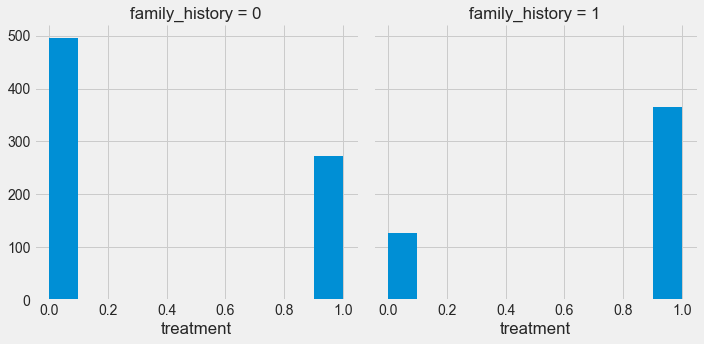

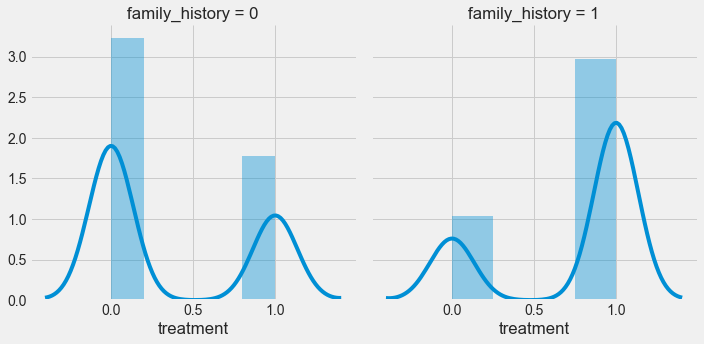

In [88]:
# Separate by treatment or not
import seaborn as sns

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import math
import seaborn as sns

g = sns.FacetGrid(train_df, col='family_history', height=5)
g = g.map(plt.hist, "treatment")

g = sns.FacetGrid(train_df, col='family_history', height=5)
g = g.map(sns.distplot, "treatment")



### Gender Analysis

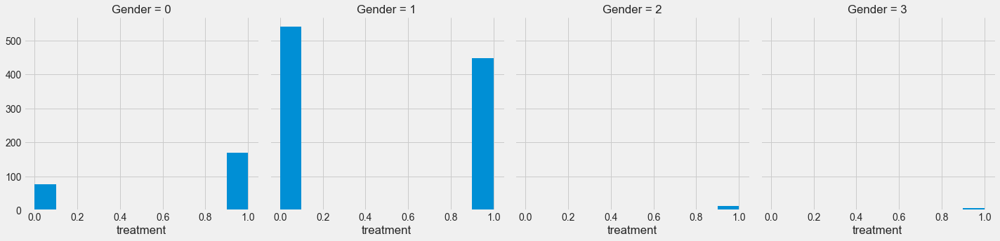

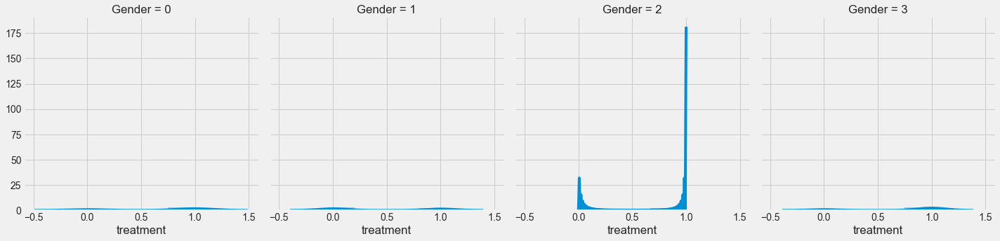

In [89]:
g = sns.FacetGrid(train_df, col='Gender', height=5)
g = g.map(plt.hist, "treatment")

g = sns.FacetGrid(train_df, col='Gender', height=5)
g = g.map(sns.distplot, "treatment")

### Correlations

In [85]:
from scipy.stats import spearmanr
data1 = train_df["care_options"]
data2 = train_df["wellness_program"]
data3 = train_df["seek_help"]
data4 = train_df["mental_health_consequence"]
data5 = train_df["benefits"]
CARE_WELL = spearmanr(data1, data2)
CARE_HELP = spearmanr(data1, data3)
CARE_CONS = spearmanr(data1, data4)
seek_help_wellness = spearmanr(data2, data3)
care_benefits = spearmanr(data1, data5)
cons_help = spearmanr(data4, data3)
cons_wellness = spearmanr(data4, data2)
print("correlation between care_options and wellness_program")
print(CARE_WELL)
print("")
print("correlation between care_options and seek_help")
print(CARE_HELP)
print("")
print("correlation between care_options and mental_health_consequences")
print(CARE_CONS)
print("")
seek_help_and_benefits =spearmanr(data2, data5)



print("Correlation between seek_help and wellness_program: ")
print(seek_help_wellness)
print("")
print("Correlation between care_options and benefits: ")
print(care_benefits)
print("")
print("Correlation between mental_health_consequences and seek_help: ")
print(cons_help)
print("")
print("Correlation between mental_health_consequences and wellness_program: ")
print(cons_wellness)
print("")
print("seek_help and benefits: ")
print(seek_help_and_benefits)

correlation between care_options and wellness_program
SpearmanrResult(correlation=0.2100284087100927, pvalue=5.111573493756851e-14)

correlation between care_options and seek_help
SpearmanrResult(correlation=0.24773595526708522, pvalue=4.622955698579955e-19)

correlation between care_options and mental_health_consequences
SpearmanrResult(correlation=0.005519994929899874, pvalue=0.8448688175559851)

Correlation between seek_help and wellness_program: 
SpearmanrResult(correlation=0.46297913471429175, pvalue=6.870359761699403e-68)

Correlation between care_options and benefits: 
SpearmanrResult(correlation=0.4376178939609296, pvalue=4.8234889330618573e-60)

Correlation between mental_health_consequences and seek_help: 
SpearmanrResult(correlation=0.050715563804124106, pvalue=0.07203772699016886)

Correlation between mental_health_consequences and wellness_program: 
SpearmanrResult(correlation=0.05284341009853756, pvalue=0.06086735969836055)

seek_help and benefits: 
SpearmanrResult(correl

### all 4 features analysis

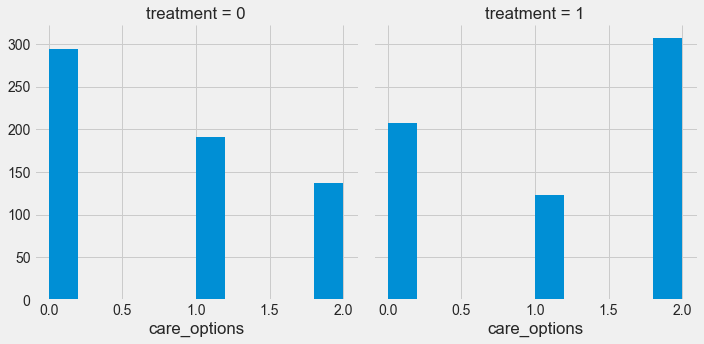

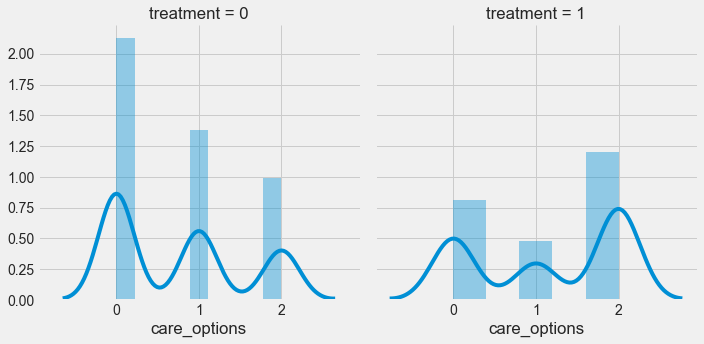

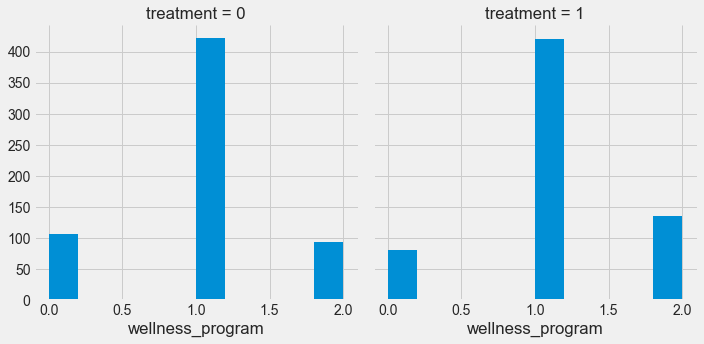

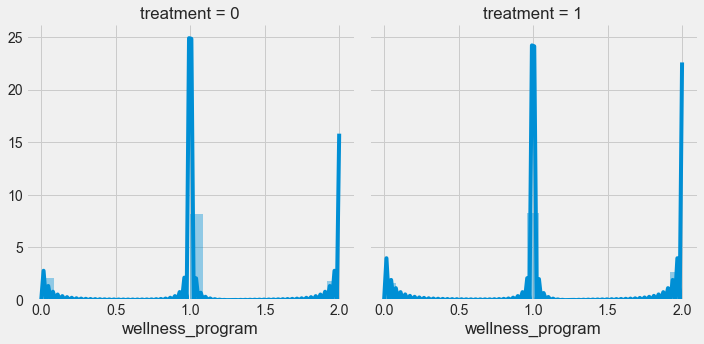

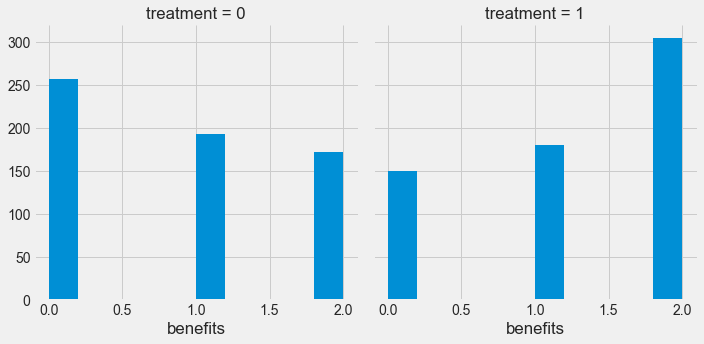

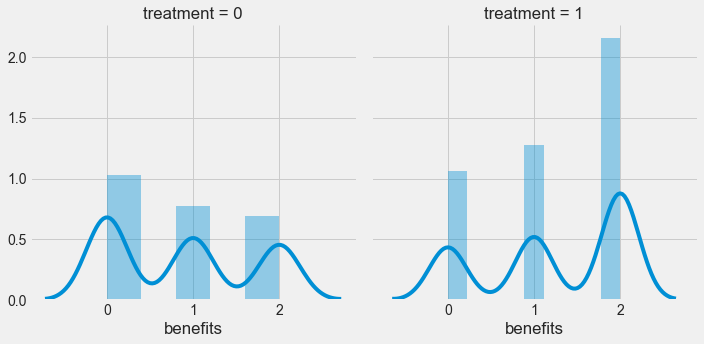

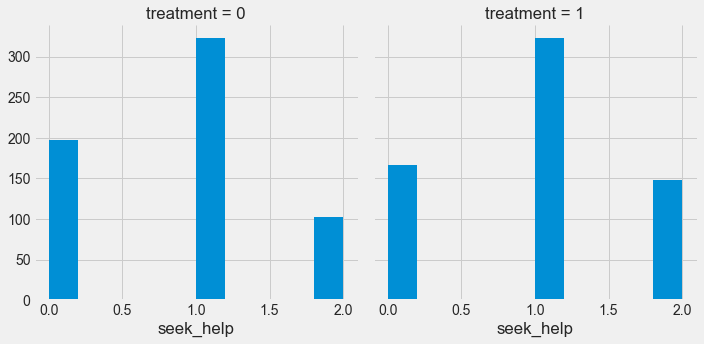

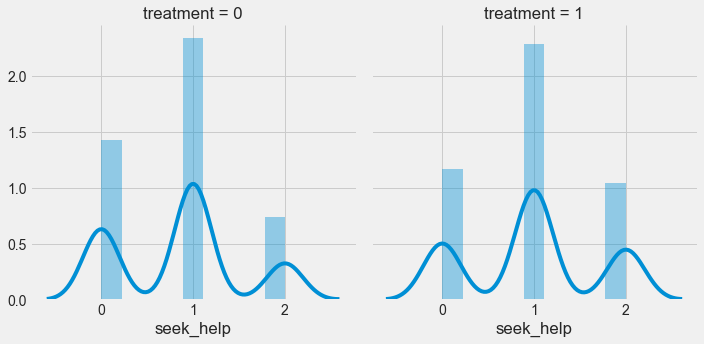

In [91]:
g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(plt.hist, "care_options")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(sns.distplot, "care_options")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(plt.hist, "wellness_program")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(sns.distplot, "wellness_program")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(plt.hist, "benefits")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(sns.distplot, "benefits")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(plt.hist, "seek_help")

g = sns.FacetGrid(train_df, col='treatment', height=5)
g = g.map(sns.distplot, "seek_help")

### work interfere analysis

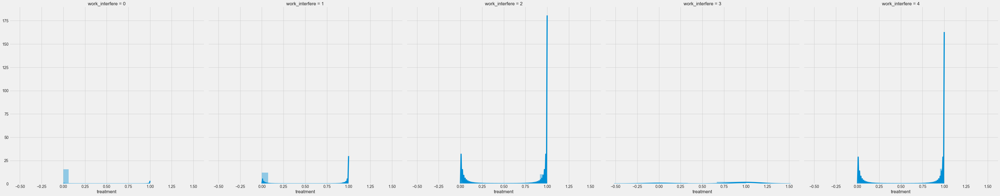

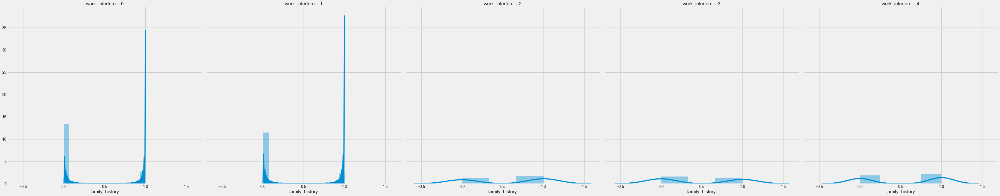

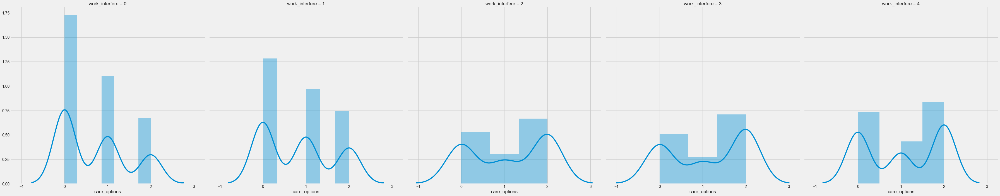

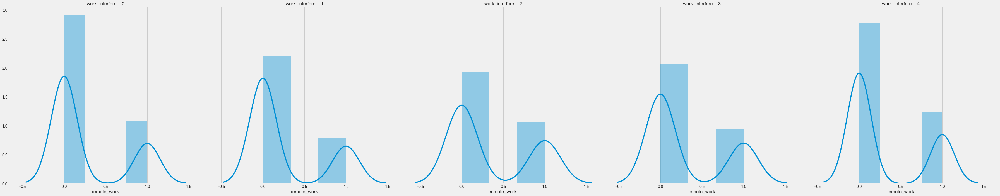

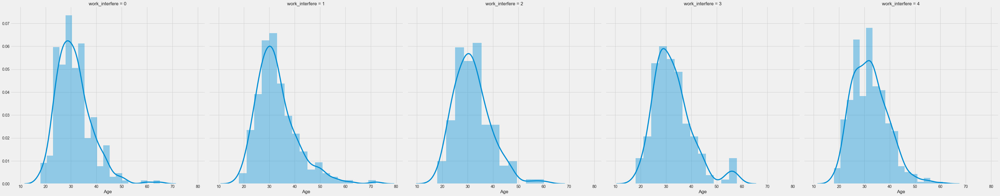

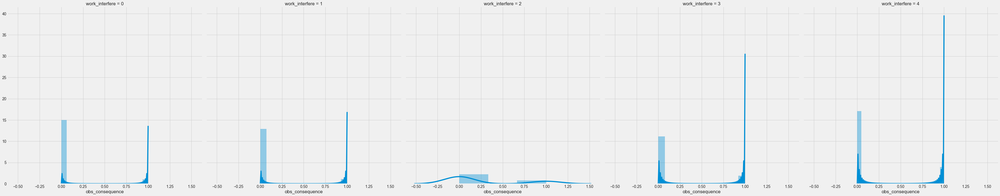

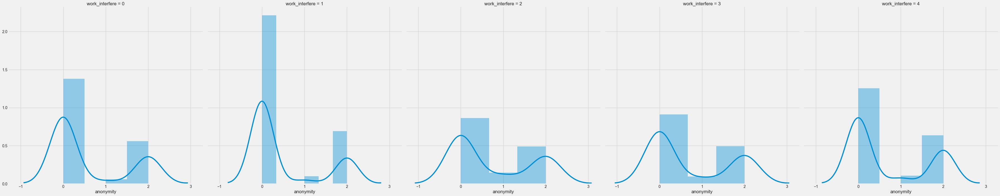

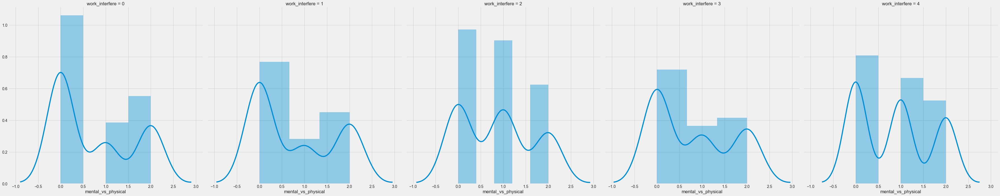

In [92]:
g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "treatment")

g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "family_history")

g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "care_options")

g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "remote_work")

g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "Age")

g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS
g = g.map(sns.distplot, "obs_consequence")

g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "anonymity")


g = sns.FacetGrid(train_df, col='work_interfere', height=10) #THIS 
g = g.map(sns.distplot, "mental_vs_physical")